In [ ]:
import numpy as np
import keras as ke
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow import reshape
from tensorflow.keras import Model,backend
from keras.models import Sequential
from matplotlib.pyplot import figure
from sklearn.metrics import mean_squared_error
import gc
import pandas as pd

In [ ]:
p= 100; 
n = 600;
sigma_2 = 0.5;
delta = 0.1;
seed = 100;
epochs = 100;

In [ ]:
train_loss_1 = np.zeros((epochs,seed))
test_loss_1 = np.zeros((epochs,seed))
train_loss_2 = np.zeros((epochs,seed))
test_loss_2 = np.zeros((epochs,seed))
train_loss_3 = np.zeros((epochs,seed))
test_loss_3 = np.zeros((epochs,seed))
train_loss_4 = np.zeros((epochs,seed))
test_loss_4 = np.zeros((epochs,seed))
train_loss_5 = np.zeros((epochs,seed))
test_loss_5 = np.zeros((epochs,seed))
train_loss_6 = np.zeros((epochs,seed))
test_loss_6 = np.zeros((epochs,seed))

In [ ]:
mean_square_error_1 = [];
mean_square_error_2 = [];
mean_square_error_3 = [];
mean_square_error_4 = [];
mean_square_error_5 = [];
mean_square_error_6 = [];

In [ ]:
def create_model_1(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model


In [ ]:
def create_model_2(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_3(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),        
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_4(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),        
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_5(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),  
        tf.keras.layers.Dense(p/2, activation="relu"),        
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def create_model_6(p):
  input_pri = tf.keras.layers.Input(shape = (p,), name = 'Input1') 
  
  Body = Sequential([
        tf.keras.layers.Dense(p, activation="relu"),
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p/2, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),
        tf.keras.layers.Dense(p/4, activation="relu"),  
        tf.keras.layers.Dense(p/2, activation="relu"),        
        tf.keras.layers.Dense(3*p/4, activation="relu"),
        tf.keras.layers.Dense(p, activation="relu")
        ],name='Head')
     
  output = Body(input_pri)

  model = Model(inputs = [input_pri], outputs = output)
  model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(lr=0.01))

  return model

In [ ]:
def simulation_processing(loss_file):

  loss = pd.DataFrame(loss_file)
  loss['min'] = loss.min(axis=1)
  loss['max'] = loss.max(axis=1)
  loss['mean'] = loss.mean(axis=1)
  loss['std'] = loss.std(axis=1)

  return loss

In [ ]:
def plot_seeds(loss):
  plt.figure(figsize=(10, 10))
  plt.plot(loss)
  plt.title('All seeds loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend()
  
  return plt.show()


In [ ]:
for f in range(0,seed):
  A = np.random.rand(p,p)
  B = np.random.rand(p,p)
  n_max_a = np.amax(A)
  n_max_b = np.amax(B)
  phi_0 = A/((1+delta)*n_max_a)
  phi_1 = B/((1+delta)*n_max_b)
  X = np.random.uniform(0,1,p)
  Y = np.random.uniform(0,1,p)
  X_t = np.zeros((n+101,p))

  for i in range(0,n+100):
    E_t = np.random.uniform(0,sigma_2,p)
    XX = np.zeros((p,p));
    XX[0,:] = X[:];
    YY = np.zeros((p,p));
    YY[0,:] = Y[:];
    aa = phi_0*XX + phi_1*YY + E_t;
    X_t[i,:] = XX[0,:];   
    X_t[i+1,:] = aa[0,:]/np.max(aa);
    X = X_t[i+1,:];
    Y = X_t[i,:];

  X_tt = X_t[101:,:]
  X_train = X_tt[:499,:]
  y_train = X_tt[1:500,:]
  X_test = X_tt[499:599,:]
  Y_test = X_tt[500:,:]

  model_1 = create_model_1(p)
  history = model_1.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_1[:,f] = history.history['loss']
  test_loss_1[:,f] = history.history['val_loss']

  model_2 = create_model_2(p)
  history = model_2.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_2[:,f] = history.history['loss']
  test_loss_2[:,f] = history.history['val_loss']

  model_3 = create_model_3(p)
  history = model_3.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_3[:,f] = history.history['loss']
  test_loss_3[:,f] = history.history['val_loss']

  model_4 = create_model_4(p)
  history = model_4.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_4[:,f] = history.history['loss']
  test_loss_4[:,f] = history.history['val_loss']

  model_5 = create_model_5(p)
  history = model_5.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_5[:,f] = history.history['loss']
  test_loss_5[:,f] = history.history['val_loss']

  model_6 = create_model_6(p)
  history = model_6.fit(X_train,y_train, epochs=epochs ,verbose = 2,validation_data = (X_test,Y_test))
  train_loss_6[:,f] = history.history['loss']
  test_loss_6[:,f] = history.history['val_loss']

  mean_square_error_1.append(mean_squared_error(Y_test,model_1.predict(X_test)))
  mean_square_error_2.append(mean_squared_error(Y_test,model_2.predict(X_test)))
  mean_square_error_3.append(mean_squared_error(Y_test,model_3.predict(X_test)))
  mean_square_error_4.append(mean_squared_error(Y_test,model_4.predict(X_test)))
  mean_square_error_5.append(mean_squared_error(Y_test,model_5.predict(X_test)))
  mean_square_error_6.append(mean_squared_error(Y_test,model_6.predict(X_test)))

  del model_1
  del model_2
  del model_3
  del model_4
  del model_5
  del model_6
  del history
  del A
  del n_max_a
  del n_max_b
  del X
  del X_t




/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
16/16 - 1s - loss: 0.1591 - val_loss: 0.1289 - 1s/epoch - 85ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1180 - val_loss: 0.1160 - 116ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1129 - val_loss: 0.1136 - 116ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1118 - val_loss: 0.1134 - 147ms/epoch - 9ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1118 - val_loss: 0.1134 - 98ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1113 - val_loss: 0.1139 - 110ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1117 - val_loss: 0.1144 - 209ms/epoch - 13ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1115 - val_loss: 0.1131 - 102ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1114 - val_loss: 0.1138 - 134ms/epoch - 8ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1113 - val_loss: 0.1147 - 124ms/epoch - 8ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1114 - val_loss: 0.1135 - 152ms/epoch - 9ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1109 - val_loss: 0.1129 - 203ms/epoch - 13ms/step
Epoch 13/100
1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1578 - val_loss: 0.1223 - 510ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1177 - val_loss: 0.1149 - 52ms/epoch - 3ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1134 - val_loss: 0.1137 - 58ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1138 - val_loss: 0.1140 - 72ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1128 - val_loss: 0.1133 - 56ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1114 - val_loss: 0.1126 - 58ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1113 - val_loss: 0.1131 - 69ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1110 - val_loss: 0.1128 - 70ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1109 - val_loss: 0.1131 - 53ms/epoch - 3ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1110 - val_loss: 0.1135 - 71ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1108 - val_loss: 0.1133 - 55ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1106 - val_loss: 0.1131 - 59ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1665 - val_loss: 0.1347 - 536ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1247 - val_loss: 0.1283 - 73ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1213 - val_loss: 0.1250 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1193 - val_loss: 0.1250 - 57ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1191 - val_loss: 0.1257 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1200 - val_loss: 0.1263 - 56ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1200 - val_loss: 0.1256 - 65ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1190 - val_loss: 0.1248 - 67ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1187 - val_loss: 0.1244 - 77ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1184 - val_loss: 0.1243 - 63ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1183 - val_loss: 0.1247 - 61ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1183 - val_loss: 0.1250 - 61ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1623 - val_loss: 0.1171 - 510ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1112 - val_loss: 0.1087 - 69ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1056 - val_loss: 0.1052 - 70ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1039 - val_loss: 0.1056 - 61ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1036 - val_loss: 0.1042 - 61ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1049 - 71ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1035 - val_loss: 0.1064 - 58ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1040 - val_loss: 0.1043 - 62ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1031 - val_loss: 0.1046 - 66ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1041 - 76ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1037 - val_loss: 0.1044 - 55ms/epoch - 3ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1032 - val_loss: 0.1039 - 79ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1526 - val_loss: 0.1168 - 509ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1138 - val_loss: 0.1114 - 65ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1110 - val_loss: 0.1102 - 73ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1099 - val_loss: 0.1098 - 88ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1095 - val_loss: 0.1108 - 56ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1093 - val_loss: 0.1100 - 65ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1107 - val_loss: 0.1099 - 76ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1092 - val_loss: 0.1096 - 63ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1090 - val_loss: 0.1098 - 58ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1092 - val_loss: 0.1105 - 62ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1090 - val_loss: 0.1098 - 61ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1084 - val_loss: 0.1099 - 77ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1507 - val_loss: 0.1138 - 545ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1097 - val_loss: 0.1061 - 72ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1063 - val_loss: 0.1051 - 61ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1065 - val_loss: 0.1055 - 65ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1057 - val_loss: 0.1051 - 56ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1054 - val_loss: 0.1050 - 63ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1052 - val_loss: 0.1044 - 70ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1048 - val_loss: 0.1039 - 61ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1049 - val_loss: 0.1049 - 73ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1050 - val_loss: 0.1048 - 76ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1046 - val_loss: 0.1043 - 59ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1044 - val_loss: 0.1044 - 63ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1496 - val_loss: 0.1206 - 526ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1171 - val_loss: 0.1105 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1077 - val_loss: 0.1046 - 68ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1053 - val_loss: 0.1043 - 79ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1048 - val_loss: 0.1043 - 74ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1048 - val_loss: 0.1046 - 59ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1042 - val_loss: 0.1031 - 79ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1035 - val_loss: 0.1032 - 71ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1035 - val_loss: 0.1031 - 82ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1032 - val_loss: 0.1031 - 66ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1031 - val_loss: 0.1030 - 61ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1031 - val_loss: 0.1031 - 68ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1639 - val_loss: 0.1197 - 509ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1142 - val_loss: 0.1070 - 65ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1066 - val_loss: 0.1049 - 89ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1057 - val_loss: 0.1027 - 76ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1041 - val_loss: 0.1026 - 73ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1037 - val_loss: 0.1027 - 58ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1040 - val_loss: 0.1023 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1040 - val_loss: 0.1038 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1026 - 65ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1033 - val_loss: 0.1024 - 58ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1033 - val_loss: 0.1024 - 63ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1027 - 68ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1705 - val_loss: 0.1253 - 530ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1183 - val_loss: 0.1226 - 62ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1138 - val_loss: 0.1106 - 63ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1072 - val_loss: 0.1108 - 66ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1068 - val_loss: 0.1107 - 66ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1062 - val_loss: 0.1105 - 67ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1062 - val_loss: 0.1098 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1062 - val_loss: 0.1100 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1055 - val_loss: 0.1103 - 61ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1056 - val_loss: 0.1092 - 72ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1053 - val_loss: 0.1107 - 73ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1059 - val_loss: 0.1103 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 0s - loss: 0.1826 - val_loss: 0.1440 - 495ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1357 - val_loss: 0.1359 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1309 - val_loss: 0.1328 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1300 - val_loss: 0.1326 - 73ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1283 - val_loss: 0.1315 - 67ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1280 - val_loss: 0.1301 - 87ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1277 - val_loss: 0.1306 - 66ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1273 - val_loss: 0.1318 - 62ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1269 - val_loss: 0.1308 - 87ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1275 - val_loss: 0.1304 - 69ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1272 - val_loss: 0.1319 - 68ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1264 - val_loss: 0.1292 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1846 - val_loss: 0.1568 - 503ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1496 - val_loss: 0.1495 - 64ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1434 - val_loss: 0.1455 - 71ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1414 - val_loss: 0.1424 - 64ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1386 - val_loss: 0.1401 - 90ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1374 - val_loss: 0.1407 - 64ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1368 - val_loss: 0.1388 - 93ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1360 - val_loss: 0.1392 - 67ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1359 - val_loss: 0.1385 - 89ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1360 - val_loss: 0.1387 - 68ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1356 - val_loss: 0.1380 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1354 - val_loss: 0.1391 - 68ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1559 - val_loss: 0.1226 - 529ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1199 - val_loss: 0.1172 - 68ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1173 - val_loss: 0.1177 - 65ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1158 - val_loss: 0.1154 - 76ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1154 - val_loss: 0.1154 - 90ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1151 - val_loss: 0.1173 - 69ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1153 - val_loss: 0.1153 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1148 - val_loss: 0.1153 - 90ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1148 - val_loss: 0.1151 - 71ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1145 - val_loss: 0.1151 - 68ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1145 - val_loss: 0.1151 - 72ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1147 - val_loss: 0.1153 - 67ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1458 - val_loss: 0.1164 - 509ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1111 - val_loss: 0.1113 - 63ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1080 - val_loss: 0.1082 - 65ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1063 - val_loss: 0.1078 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1055 - val_loss: 0.1059 - 96ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1038 - val_loss: 0.1054 - 71ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1036 - val_loss: 0.1057 - 88ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1037 - val_loss: 0.1049 - 80ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1033 - val_loss: 0.1052 - 70ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1031 - val_loss: 0.1051 - 59ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1052 - 63ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1029 - val_loss: 0.1049 - 63ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1697 - val_loss: 0.1277 - 529ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1247 - val_loss: 0.1215 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1213 - val_loss: 0.1195 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1201 - val_loss: 0.1181 - 68ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1170 - val_loss: 0.1158 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1165 - val_loss: 0.1175 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1159 - val_loss: 0.1149 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1145 - val_loss: 0.1146 - 92ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1144 - val_loss: 0.1151 - 93ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1140 - val_loss: 0.1141 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1140 - val_loss: 0.1143 - 61ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1138 - val_loss: 0.1148 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1640 - val_loss: 0.1271 - 515ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1223 - val_loss: 0.1195 - 61ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1191 - val_loss: 0.1193 - 75ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1183 - val_loss: 0.1180 - 71ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1178 - val_loss: 0.1180 - 92ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1177 - val_loss: 0.1183 - 93ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1175 - val_loss: 0.1178 - 92ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1171 - val_loss: 0.1178 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1172 - val_loss: 0.1180 - 82ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1174 - val_loss: 0.1180 - 86ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1171 - val_loss: 0.1178 - 68ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1170 - val_loss: 0.1179 - 78ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1731 - val_loss: 0.1338 - 514ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1248 - val_loss: 0.1262 - 94ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1196 - val_loss: 0.1236 - 70ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1186 - val_loss: 0.1232 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1180 - val_loss: 0.1225 - 75ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1177 - val_loss: 0.1230 - 68ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1178 - val_loss: 0.1231 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1176 - val_loss: 0.1229 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1176 - val_loss: 0.1227 - 62ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1175 - val_loss: 0.1239 - 105ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1172 - val_loss: 0.1222 - 69ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1172 - val_loss: 0.1227 - 65ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1573 - val_loss: 0.1306 - 502ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1275 - val_loss: 0.1290 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1231 - val_loss: 0.1192 - 69ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1174 - val_loss: 0.1180 - 79ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1158 - val_loss: 0.1175 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1159 - val_loss: 0.1167 - 73ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1155 - val_loss: 0.1163 - 77ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1152 - val_loss: 0.1171 - 76ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1155 - val_loss: 0.1160 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1151 - val_loss: 0.1167 - 64ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1153 - val_loss: 0.1167 - 98ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1150 - val_loss: 0.1159 - 72ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1351 - val_loss: 0.1052 - 525ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1025 - val_loss: 0.0981 - 68ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.0984 - val_loss: 0.0963 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0967 - val_loss: 0.0966 - 72ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0966 - val_loss: 0.0952 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0958 - val_loss: 0.0958 - 62ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0957 - val_loss: 0.0956 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0956 - val_loss: 0.0955 - 69ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0952 - val_loss: 0.0964 - 86ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0953 - val_loss: 0.0956 - 96ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0947 - val_loss: 0.0946 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0934 - val_loss: 0.0940 - 75ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1602 - val_loss: 0.1264 - 527ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1193 - val_loss: 0.1175 - 91ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1126 - val_loss: 0.1139 - 90ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1106 - val_loss: 0.1133 - 67ms/epoch - 4ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1098 - val_loss: 0.1123 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1091 - val_loss: 0.1123 - 69ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1090 - val_loss: 0.1125 - 73ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1089 - val_loss: 0.1121 - 89ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1092 - val_loss: 0.1117 - 85ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1085 - val_loss: 0.1120 - 73ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1085 - val_loss: 0.1118 - 71ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1087 - val_loss: 0.1121 - 66ms/epoch - 4ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1516 - val_loss: 0.1224 - 517ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1172 - val_loss: 0.1128 - 73ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1112 - val_loss: 0.1097 - 75ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1106 - val_loss: 0.1099 - 74ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1101 - val_loss: 0.1086 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1095 - val_loss: 0.1113 - 64ms/epoch - 4ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1103 - val_loss: 0.1097 - 99ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1102 - val_loss: 0.1089 - 71ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1095 - val_loss: 0.1090 - 68ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1093 - val_loss: 0.1083 - 88ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1091 - val_loss: 0.1084 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1089 - val_loss: 0.1083 - 74ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1554 - val_loss: 0.1150 - 504ms/epoch - 31ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1091 - val_loss: 0.1024 - 99ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1027 - val_loss: 0.1014 - 66ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1015 - val_loss: 0.0996 - 73ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1009 - val_loss: 0.1000 - 91ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1013 - val_loss: 0.1000 - 85ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1009 - val_loss: 0.1002 - 83ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1007 - val_loss: 0.0993 - 78ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1004 - val_loss: 0.0999 - 75ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1010 - val_loss: 0.1000 - 90ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1007 - val_loss: 0.0996 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1002 - val_loss: 0.0994 - 72ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1698 - val_loss: 0.1351 - 524ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1309 - val_loss: 0.1279 - 74ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1277 - val_loss: 0.1267 - 94ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1270 - val_loss: 0.1265 - 89ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1268 - val_loss: 0.1260 - 102ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1268 - val_loss: 0.1281 - 77ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1268 - val_loss: 0.1271 - 77ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1267 - val_loss: 0.1276 - 75ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1264 - val_loss: 0.1258 - 90ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1259 - val_loss: 0.1263 - 70ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1262 - val_loss: 0.1276 - 77ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1264 - val_loss: 0.1262 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1408 - val_loss: 0.1015 - 506ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.0965 - val_loss: 0.0967 - 75ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.0935 - val_loss: 0.0949 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0923 - val_loss: 0.0953 - 77ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0924 - val_loss: 0.0950 - 74ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0929 - val_loss: 0.0940 - 92ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0916 - val_loss: 0.0941 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0917 - val_loss: 0.0951 - 71ms/epoch - 4ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0914 - val_loss: 0.0949 - 70ms/epoch - 4ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0915 - val_loss: 0.0946 - 73ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0911 - val_loss: 0.0948 - 70ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0912 - val_loss: 0.0942 - 89ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1697 - val_loss: 0.1435 - 517ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1435 - val_loss: 0.1377 - 71ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1396 - val_loss: 0.1360 - 76ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1390 - val_loss: 0.1371 - 74ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1388 - val_loss: 0.1363 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1387 - val_loss: 0.1367 - 73ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1386 - val_loss: 0.1346 - 75ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1358 - val_loss: 0.1337 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1353 - val_loss: 0.1342 - 78ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1351 - val_loss: 0.1337 - 107ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1350 - val_loss: 0.1336 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1353 - val_loss: 0.1335 - 90ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1828 - val_loss: 0.1525 - 509ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1439 - val_loss: 0.1415 - 75ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1388 - val_loss: 0.1397 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1371 - val_loss: 0.1380 - 104ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1365 - val_loss: 0.1382 - 73ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1366 - val_loss: 0.1379 - 90ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1363 - val_loss: 0.1379 - 92ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1360 - val_loss: 0.1381 - 96ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1352 - val_loss: 0.1369 - 73ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1339 - val_loss: 0.1356 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1340 - val_loss: 0.1345 - 87ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1333 - val_loss: 0.1356 - 91ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1564 - val_loss: 0.1224 - 923ms/epoch - 58ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1176 - val_loss: 0.1170 - 91ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1148 - val_loss: 0.1168 - 74ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1142 - val_loss: 0.1164 - 96ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1152 - val_loss: 0.1156 - 97ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1153 - val_loss: 0.1164 - 95ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1137 - val_loss: 0.1159 - 71ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1137 - val_loss: 0.1161 - 72ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1134 - val_loss: 0.1162 - 80ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1134 - val_loss: 0.1155 - 70ms/epoch - 4ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1136 - val_loss: 0.1157 - 71ms/epoch - 4ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1136 - val_loss: 0.1154 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1594 - val_loss: 0.1254 - 514ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1278 - val_loss: 0.1212 - 73ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1242 - val_loss: 0.1190 - 73ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1234 - val_loss: 0.1192 - 91ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1235 - val_loss: 0.1187 - 74ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1233 - val_loss: 0.1191 - 93ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1231 - val_loss: 0.1192 - 101ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1230 - val_loss: 0.1192 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1230 - val_loss: 0.1186 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1228 - val_loss: 0.1188 - 75ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1227 - val_loss: 0.1191 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1226 - val_loss: 0.1185 - 76ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1488 - val_loss: 0.1094 - 526ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1051 - val_loss: 0.1026 - 83ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1013 - val_loss: 0.1004 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1006 - val_loss: 0.1005 - 89ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1004 - val_loss: 0.1009 - 73ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1001 - val_loss: 0.1002 - 89ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1000 - val_loss: 0.1035 - 102ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1010 - val_loss: 0.1005 - 93ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1001 - val_loss: 0.1002 - 74ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0996 - val_loss: 0.0996 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0993 - val_loss: 0.1001 - 77ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0991 - val_loss: 0.0999 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1468 - val_loss: 0.1083 - 539ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1032 - val_loss: 0.0981 - 74ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.0948 - val_loss: 0.0938 - 76ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0926 - val_loss: 0.0943 - 76ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0916 - val_loss: 0.0931 - 76ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0910 - val_loss: 0.0930 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0909 - val_loss: 0.0927 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0910 - val_loss: 0.0922 - 83ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0905 - val_loss: 0.0929 - 80ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0906 - val_loss: 0.0923 - 80ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0905 - val_loss: 0.0928 - 76ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0905 - val_loss: 0.0937 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1517 - val_loss: 0.1224 - 522ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1137 - val_loss: 0.1089 - 94ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1028 - val_loss: 0.1012 - 76ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0982 - val_loss: 0.0990 - 76ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0975 - val_loss: 0.0976 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0970 - val_loss: 0.1013 - 75ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0973 - val_loss: 0.0987 - 73ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0973 - val_loss: 0.0984 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0965 - val_loss: 0.0974 - 122ms/epoch - 8ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0961 - val_loss: 0.0971 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0958 - val_loss: 0.0978 - 78ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0960 - val_loss: 0.0988 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1643 - val_loss: 0.1309 - 511ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1271 - val_loss: 0.1189 - 82ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1192 - val_loss: 0.1142 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1160 - val_loss: 0.1131 - 74ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1161 - val_loss: 0.1140 - 88ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1156 - val_loss: 0.1130 - 73ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1154 - val_loss: 0.1129 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1153 - val_loss: 0.1129 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1150 - val_loss: 0.1128 - 83ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1149 - val_loss: 0.1132 - 93ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1151 - val_loss: 0.1130 - 106ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1147 - val_loss: 0.1137 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1519 - val_loss: 0.1254 - 531ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1218 - val_loss: 0.1215 - 81ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1193 - val_loss: 0.1200 - 78ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1178 - val_loss: 0.1191 - 93ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1170 - val_loss: 0.1187 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1167 - val_loss: 0.1189 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1166 - val_loss: 0.1187 - 91ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1168 - val_loss: 0.1188 - 99ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1167 - val_loss: 0.1176 - 103ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1149 - val_loss: 0.1174 - 120ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1147 - val_loss: 0.1172 - 80ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1145 - val_loss: 0.1170 - 99ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1512 - val_loss: 0.1155 - 537ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1083 - val_loss: 0.1072 - 74ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1063 - val_loss: 0.1061 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1048 - val_loss: 0.1070 - 91ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1046 - val_loss: 0.1064 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1042 - val_loss: 0.1066 - 79ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1042 - val_loss: 0.1068 - 98ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1036 - val_loss: 0.1055 - 103ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1040 - val_loss: 0.1056 - 101ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1036 - val_loss: 0.1053 - 84ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1033 - val_loss: 0.1052 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1061 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1595 - val_loss: 0.1169 - 513ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1166 - val_loss: 0.1140 - 96ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1104 - val_loss: 0.1085 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1081 - val_loss: 0.1070 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1081 - val_loss: 0.1059 - 94ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1066 - val_loss: 0.1059 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1056 - val_loss: 0.1059 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1058 - val_loss: 0.1073 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1058 - val_loss: 0.1046 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1052 - val_loss: 0.1040 - 101ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1049 - val_loss: 0.1047 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1045 - val_loss: 0.1048 - 96ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1808 - val_loss: 0.1382 - 532ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1286 - val_loss: 0.1236 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1204 - val_loss: 0.1199 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1188 - val_loss: 0.1201 - 83ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1190 - val_loss: 0.1198 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1184 - val_loss: 0.1214 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1187 - val_loss: 0.1192 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1180 - val_loss: 0.1198 - 87ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1184 - val_loss: 0.1198 - 81ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1186 - val_loss: 0.1198 - 94ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1185 - val_loss: 0.1188 - 97ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1175 - val_loss: 0.1162 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1587 - val_loss: 0.1193 - 565ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1166 - val_loss: 0.1086 - 81ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1116 - val_loss: 0.1090 - 76ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1106 - val_loss: 0.1087 - 94ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1115 - val_loss: 0.1081 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1104 - val_loss: 0.1094 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1101 - val_loss: 0.1073 - 87ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1103 - val_loss: 0.1091 - 96ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1100 - val_loss: 0.1077 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1098 - val_loss: 0.1090 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1096 - val_loss: 0.1080 - 100ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1096 - val_loss: 0.1081 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1412 - val_loss: 0.1066 - 509ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1030 - val_loss: 0.1022 - 82ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1001 - val_loss: 0.1006 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0998 - val_loss: 0.1012 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0992 - val_loss: 0.0975 - 87ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0961 - val_loss: 0.0973 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0960 - val_loss: 0.0973 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0958 - val_loss: 0.0969 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0956 - val_loss: 0.0970 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0956 - val_loss: 0.0963 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0958 - val_loss: 0.0968 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0957 - val_loss: 0.0973 - 135ms/epoch - 8ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1582 - val_loss: 0.1208 - 510ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1111 - val_loss: 0.1102 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1071 - val_loss: 0.1085 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1058 - val_loss: 0.1085 - 79ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1058 - val_loss: 0.1092 - 77ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1052 - val_loss: 0.1071 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1040 - val_loss: 0.1072 - 100ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1062 - 96ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1068 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1033 - val_loss: 0.1068 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1039 - val_loss: 0.1077 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1069 - 81ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1549 - val_loss: 0.1175 - 520ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1141 - val_loss: 0.1119 - 80ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1103 - val_loss: 0.1091 - 89ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1092 - val_loss: 0.1096 - 82ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1090 - val_loss: 0.1092 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1085 - val_loss: 0.1095 - 78ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1084 - val_loss: 0.1092 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1085 - val_loss: 0.1093 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1081 - val_loss: 0.1092 - 83ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1081 - val_loss: 0.1087 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1081 - val_loss: 0.1090 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1079 - val_loss: 0.1091 - 95ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1734 - val_loss: 0.1368 - 509ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1351 - val_loss: 0.1333 - 71ms/epoch - 4ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1335 - val_loss: 0.1318 - 68ms/epoch - 4ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1327 - val_loss: 0.1317 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1317 - val_loss: 0.1312 - 122ms/epoch - 8ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1312 - val_loss: 0.1309 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1313 - val_loss: 0.1305 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1316 - val_loss: 0.1311 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1311 - val_loss: 0.1313 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1309 - val_loss: 0.1313 - 84ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1308 - val_loss: 0.1310 - 96ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1306 - val_loss: 0.1311 - 107ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1637 - val_loss: 0.1225 - 524ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1181 - val_loss: 0.1142 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1146 - val_loss: 0.1129 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1125 - val_loss: 0.1100 - 82ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1116 - val_loss: 0.1103 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1121 - val_loss: 0.1100 - 80ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1117 - val_loss: 0.1088 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1100 - val_loss: 0.1082 - 76ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1100 - val_loss: 0.1095 - 103ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1099 - val_loss: 0.1081 - 97ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1098 - val_loss: 0.1086 - 81ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1099 - val_loss: 0.1099 - 92ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1859 - val_loss: 0.1315 - 544ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1238 - val_loss: 0.1206 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1143 - val_loss: 0.1143 - 99ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1123 - val_loss: 0.1140 - 98ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1124 - val_loss: 0.1186 - 87ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1126 - val_loss: 0.1139 - 83ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1115 - val_loss: 0.1131 - 88ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1111 - val_loss: 0.1133 - 89ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1109 - val_loss: 0.1135 - 81ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1108 - val_loss: 0.1133 - 91ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1108 - val_loss: 0.1138 - 96ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1107 - val_loss: 0.1142 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1746 - val_loss: 0.1404 - 526ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1325 - val_loss: 0.1282 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1272 - val_loss: 0.1273 - 103ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1264 - val_loss: 0.1276 - 101ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1262 - val_loss: 0.1266 - 90ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1259 - val_loss: 0.1265 - 98ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1256 - val_loss: 0.1263 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1253 - val_loss: 0.1261 - 96ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1251 - val_loss: 0.1253 - 85ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1250 - val_loss: 0.1258 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1197 - val_loss: 0.1184 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1166 - val_loss: 0.1179 - 92ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1533 - val_loss: 0.1109 - 542ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1078 - val_loss: 0.1095 - 96ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1054 - val_loss: 0.1046 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1041 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1032 - val_loss: 0.1036 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1029 - val_loss: 0.1045 - 83ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1031 - val_loss: 0.1037 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1026 - val_loss: 0.1036 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1027 - val_loss: 0.1039 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1023 - val_loss: 0.1042 - 95ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1019 - val_loss: 0.1020 - 95ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1008 - val_loss: 0.1015 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1583 - val_loss: 0.1214 - 530ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1173 - val_loss: 0.1148 - 103ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1137 - val_loss: 0.1129 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1126 - val_loss: 0.1097 - 83ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1102 - val_loss: 0.1093 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1097 - val_loss: 0.1092 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1095 - val_loss: 0.1089 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1094 - val_loss: 0.1096 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1098 - val_loss: 0.1100 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1096 - val_loss: 0.1091 - 91ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1094 - val_loss: 0.1095 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1089 - val_loss: 0.1095 - 87ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1610 - val_loss: 0.1286 - 507ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1191 - val_loss: 0.1157 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1127 - val_loss: 0.1116 - 88ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1120 - val_loss: 0.1124 - 86ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1114 - val_loss: 0.1113 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1113 - val_loss: 0.1125 - 87ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1117 - val_loss: 0.1110 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1106 - val_loss: 0.1104 - 93ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1105 - val_loss: 0.1108 - 114ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1108 - val_loss: 0.1104 - 107ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1090 - val_loss: 0.1066 - 107ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1071 - val_loss: 0.1064 - 100ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1767 - val_loss: 0.1411 - 523ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1424 - val_loss: 0.1368 - 89ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1401 - val_loss: 0.1373 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1392 - val_loss: 0.1370 - 79ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1391 - val_loss: 0.1359 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1387 - val_loss: 0.1385 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1391 - val_loss: 0.1366 - 95ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1384 - val_loss: 0.1371 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1386 - val_loss: 0.1362 - 101ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1380 - val_loss: 0.1328 - 90ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1298 - val_loss: 0.1233 - 101ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1260 - val_loss: 0.1239 - 113ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1796 - val_loss: 0.1441 - 524ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1386 - val_loss: 0.1352 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1338 - val_loss: 0.1325 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1326 - val_loss: 0.1320 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1319 - val_loss: 0.1317 - 100ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1320 - val_loss: 0.1324 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1319 - val_loss: 0.1319 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1318 - val_loss: 0.1325 - 92ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1318 - val_loss: 0.1316 - 94ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1313 - val_loss: 0.1317 - 76ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1306 - val_loss: 0.1306 - 101ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1303 - val_loss: 0.1308 - 72ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1572 - val_loss: 0.1283 - 526ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1230 - val_loss: 0.1232 - 98ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1209 - val_loss: 0.1226 - 112ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1208 - val_loss: 0.1211 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1182 - val_loss: 0.1190 - 92ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1176 - val_loss: 0.1192 - 89ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1173 - val_loss: 0.1205 - 93ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1174 - val_loss: 0.1185 - 90ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1172 - val_loss: 0.1188 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1169 - val_loss: 0.1190 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1167 - val_loss: 0.1187 - 87ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1168 - val_loss: 0.1188 - 91ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1780 - val_loss: 0.1403 - 508ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1400 - val_loss: 0.1344 - 84ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1357 - val_loss: 0.1332 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1351 - val_loss: 0.1329 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1344 - val_loss: 0.1328 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1344 - val_loss: 0.1330 - 89ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1338 - val_loss: 0.1337 - 89ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1339 - val_loss: 0.1329 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1337 - val_loss: 0.1332 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1339 - val_loss: 0.1330 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1335 - val_loss: 0.1333 - 103ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1333 - val_loss: 0.1336 - 113ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1576 - val_loss: 0.1159 - 538ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1113 - val_loss: 0.1087 - 87ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1067 - val_loss: 0.1051 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1055 - val_loss: 0.1060 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1053 - val_loss: 0.1056 - 71ms/epoch - 4ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1051 - val_loss: 0.1060 - 80ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1053 - val_loss: 0.1049 - 103ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1050 - val_loss: 0.1064 - 115ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1050 - val_loss: 0.1056 - 98ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1047 - val_loss: 0.1067 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1047 - val_loss: 0.1053 - 81ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1044 - val_loss: 0.1047 - 79ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1602 - val_loss: 0.1131 - 516ms/epoch - 32ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1099 - val_loss: 0.1014 - 89ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1024 - val_loss: 0.0986 - 93ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1012 - val_loss: 0.0979 - 82ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1007 - val_loss: 0.0976 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1005 - val_loss: 0.0978 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1006 - val_loss: 0.0981 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1004 - val_loss: 0.0977 - 96ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0999 - val_loss: 0.0973 - 86ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1002 - val_loss: 0.0985 - 85ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1000 - val_loss: 0.0993 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1000 - val_loss: 0.0974 - 95ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1766 - val_loss: 0.1448 - 553ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1408 - val_loss: 0.1376 - 92ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1380 - val_loss: 0.1368 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1372 - val_loss: 0.1368 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1374 - val_loss: 0.1382 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1375 - val_loss: 0.1373 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1368 - val_loss: 0.1365 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1366 - val_loss: 0.1363 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1362 - val_loss: 0.1367 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1365 - val_loss: 0.1370 - 80ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1368 - val_loss: 0.1375 - 93ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1369 - val_loss: 0.1370 - 85ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1399 - val_loss: 0.1057 - 545ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.0982 - val_loss: 0.0942 - 108ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.0927 - val_loss: 0.0915 - 102ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0910 - val_loss: 0.0910 - 88ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0907 - val_loss: 0.0918 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0905 - val_loss: 0.0922 - 95ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0913 - val_loss: 0.0911 - 87ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0902 - val_loss: 0.0908 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0906 - val_loss: 0.0921 - 90ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0907 - val_loss: 0.0914 - 96ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0902 - val_loss: 0.0911 - 106ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0901 - val_loss: 0.0905 - 95ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1611 - val_loss: 0.1251 - 552ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1229 - val_loss: 0.1215 - 88ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1222 - val_loss: 0.1217 - 94ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1196 - val_loss: 0.1193 - 105ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1193 - val_loss: 0.1202 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1190 - val_loss: 0.1194 - 103ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1189 - val_loss: 0.1195 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1191 - val_loss: 0.1195 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1189 - val_loss: 0.1194 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1185 - val_loss: 0.1188 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1184 - val_loss: 0.1189 - 95ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1185 - val_loss: 0.1188 - 104ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1864 - val_loss: 0.1484 - 533ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1449 - val_loss: 0.1422 - 82ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1411 - val_loss: 0.1403 - 89ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1398 - val_loss: 0.1398 - 77ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1398 - val_loss: 0.1404 - 100ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1388 - val_loss: 0.1370 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1354 - val_loss: 0.1356 - 87ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1347 - val_loss: 0.1352 - 105ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1344 - val_loss: 0.1356 - 114ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1342 - val_loss: 0.1353 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1340 - val_loss: 0.1348 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1338 - val_loss: 0.1348 - 85ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1832 - val_loss: 0.1373 - 551ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1326 - val_loss: 0.1281 - 108ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1290 - val_loss: 0.1279 - 99ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1283 - val_loss: 0.1275 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1279 - val_loss: 0.1271 - 106ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1283 - val_loss: 0.1266 - 98ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1280 - val_loss: 0.1269 - 95ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1272 - val_loss: 0.1264 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1272 - val_loss: 0.1274 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1272 - val_loss: 0.1262 - 88ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1268 - val_loss: 0.1266 - 103ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1269 - val_loss: 0.1263 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1481 - val_loss: 0.1132 - 964ms/epoch - 60ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1068 - val_loss: 0.1069 - 100ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1038 - val_loss: 0.1059 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1032 - val_loss: 0.1055 - 99ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1027 - val_loss: 0.1058 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1026 - val_loss: 0.1054 - 109ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1025 - val_loss: 0.1053 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1026 - val_loss: 0.1051 - 83ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1026 - val_loss: 0.1054 - 86ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1026 - val_loss: 0.1050 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1027 - val_loss: 0.1051 - 97ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1028 - val_loss: 0.1055 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1673 - val_loss: 0.1376 - 667ms/epoch - 42ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1327 - val_loss: 0.1294 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1273 - val_loss: 0.1255 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1256 - val_loss: 0.1262 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1251 - val_loss: 0.1235 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1231 - val_loss: 0.1229 - 106ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1231 - val_loss: 0.1234 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1231 - val_loss: 0.1231 - 86ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1228 - val_loss: 0.1237 - 81ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1228 - val_loss: 0.1232 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1226 - val_loss: 0.1229 - 81ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1223 - val_loss: 0.1238 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1623 - val_loss: 0.1169 - 537ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1144 - val_loss: 0.1101 - 88ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1102 - val_loss: 0.1065 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1093 - val_loss: 0.1064 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1085 - val_loss: 0.1058 - 113ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1081 - val_loss: 0.1063 - 81ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1080 - val_loss: 0.1058 - 88ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1080 - val_loss: 0.1074 - 91ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1075 - val_loss: 0.1055 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1062 - val_loss: 0.1042 - 115ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1061 - val_loss: 0.1047 - 121ms/epoch - 8ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1060 - val_loss: 0.1048 - 107ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1606 - val_loss: 0.1331 - 522ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1268 - val_loss: 0.1257 - 100ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1222 - val_loss: 0.1249 - 94ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1210 - val_loss: 0.1256 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1207 - val_loss: 0.1241 - 78ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1202 - val_loss: 0.1249 - 97ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1205 - val_loss: 0.1250 - 126ms/epoch - 8ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1201 - val_loss: 0.1243 - 116ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1198 - val_loss: 0.1238 - 115ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1196 - val_loss: 0.1239 - 118ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1193 - val_loss: 0.1242 - 92ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1192 - val_loss: 0.1238 - 93ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1740 - val_loss: 0.1404 - 586ms/epoch - 37ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1263 - val_loss: 0.1043 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1029 - val_loss: 0.1012 - 98ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1011 - val_loss: 0.1004 - 95ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1003 - val_loss: 0.1000 - 95ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0970 - val_loss: 0.0961 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0946 - val_loss: 0.0948 - 93ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0942 - val_loss: 0.0948 - 89ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0946 - val_loss: 0.0946 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0943 - val_loss: 0.0948 - 92ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0940 - val_loss: 0.0946 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0941 - val_loss: 0.0955 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1549 - val_loss: 0.1228 - 535ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1190 - val_loss: 0.1141 - 96ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1114 - val_loss: 0.1090 - 91ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1098 - val_loss: 0.1083 - 97ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1090 - val_loss: 0.1088 - 98ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1088 - val_loss: 0.1084 - 110ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1084 - val_loss: 0.1088 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1083 - val_loss: 0.1084 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1083 - val_loss: 0.1105 - 93ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1084 - val_loss: 0.1086 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1082 - val_loss: 0.1082 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1083 - val_loss: 0.1082 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1597 - val_loss: 0.1318 - 542ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1270 - val_loss: 0.1254 - 99ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1238 - val_loss: 0.1225 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1211 - val_loss: 0.1215 - 100ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1207 - val_loss: 0.1214 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1207 - val_loss: 0.1215 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1204 - val_loss: 0.1213 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1199 - val_loss: 0.1208 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1198 - val_loss: 0.1210 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1198 - val_loss: 0.1212 - 95ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1198 - val_loss: 0.1219 - 95ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1202 - val_loss: 0.1212 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1813 - val_loss: 0.1376 - 532ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1299 - val_loss: 0.1346 - 91ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1273 - val_loss: 0.1284 - 93ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1252 - val_loss: 0.1285 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1251 - val_loss: 0.1273 - 86ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1246 - val_loss: 0.1283 - 78ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1251 - val_loss: 0.1271 - 79ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1256 - val_loss: 0.1288 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1249 - val_loss: 0.1277 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1241 - val_loss: 0.1274 - 95ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1241 - val_loss: 0.1273 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1240 - val_loss: 0.1269 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1484 - val_loss: 0.1141 - 537ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1132 - val_loss: 0.1103 - 96ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1104 - val_loss: 0.1092 - 86ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1101 - val_loss: 0.1086 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1095 - val_loss: 0.1084 - 92ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1091 - val_loss: 0.1081 - 80ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1089 - val_loss: 0.1092 - 79ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1088 - val_loss: 0.1082 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1086 - val_loss: 0.1091 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1084 - val_loss: 0.1088 - 83ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1084 - val_loss: 0.1087 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1089 - val_loss: 0.1086 - 88ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1795 - val_loss: 0.1473 - 531ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1443 - val_loss: 0.1439 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1411 - val_loss: 0.1418 - 112ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1402 - val_loss: 0.1412 - 138ms/epoch - 9ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1400 - val_loss: 0.1409 - 121ms/epoch - 8ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1399 - val_loss: 0.1402 - 112ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1397 - val_loss: 0.1406 - 98ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1395 - val_loss: 0.1407 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1394 - val_loss: 0.1397 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1395 - val_loss: 0.1402 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1393 - val_loss: 0.1410 - 85ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1392 - val_loss: 0.1407 - 103ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1973 - val_loss: 0.1662 - 535ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1612 - val_loss: 0.1592 - 73ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1577 - val_loss: 0.1531 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1521 - val_loss: 0.1516 - 99ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1516 - val_loss: 0.1505 - 77ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1502 - val_loss: 0.1503 - 93ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1500 - val_loss: 0.1505 - 91ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1501 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1501 - val_loss: 0.1506 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1502 - val_loss: 0.1508 - 101ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1490 - val_loss: 0.1483 - 98ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1484 - val_loss: 0.1485 - 140ms/epoch - 9ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1541 - val_loss: 0.1176 - 750ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1125 - val_loss: 0.1102 - 84ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1082 - val_loss: 0.1071 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1065 - val_loss: 0.1065 - 96ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1066 - val_loss: 0.1071 - 81ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1062 - val_loss: 0.1067 - 82ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1061 - val_loss: 0.1065 - 90ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1063 - val_loss: 0.1067 - 104ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1065 - val_loss: 0.1072 - 91ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1062 - val_loss: 0.1066 - 97ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1056 - val_loss: 0.1067 - 119ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1060 - val_loss: 0.1065 - 92ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1777 - val_loss: 0.1406 - 718ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1384 - val_loss: 0.1339 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1344 - val_loss: 0.1349 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1332 - val_loss: 0.1290 - 95ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1303 - val_loss: 0.1284 - 114ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1292 - val_loss: 0.1284 - 114ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1291 - val_loss: 0.1281 - 122ms/epoch - 8ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1291 - val_loss: 0.1279 - 127ms/epoch - 8ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1290 - val_loss: 0.1280 - 78ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1285 - val_loss: 0.1307 - 99ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1287 - val_loss: 0.1278 - 86ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1284 - val_loss: 0.1280 - 102ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1501 - val_loss: 0.1208 - 550ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1153 - val_loss: 0.1171 - 112ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1131 - val_loss: 0.1166 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1115 - val_loss: 0.1152 - 99ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1113 - val_loss: 0.1145 - 97ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1110 - val_loss: 0.1143 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1110 - val_loss: 0.1150 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1111 - val_loss: 0.1145 - 90ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1109 - val_loss: 0.1142 - 109ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1105 - val_loss: 0.1142 - 91ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1107 - val_loss: 0.1146 - 104ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1105 - val_loss: 0.1142 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1572 - val_loss: 0.1148 - 766ms/epoch - 48ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1146 - val_loss: 0.1123 - 124ms/epoch - 8ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1097 - val_loss: 0.1065 - 112ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1085 - val_loss: 0.1059 - 94ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1088 - val_loss: 0.1062 - 107ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1078 - val_loss: 0.1058 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1079 - val_loss: 0.1061 - 96ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1077 - val_loss: 0.1060 - 91ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1075 - val_loss: 0.1061 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1077 - val_loss: 0.1057 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1073 - val_loss: 0.1060 - 93ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1070 - val_loss: 0.1057 - 82ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1466 - val_loss: 0.1215 - 532ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1149 - val_loss: 0.1120 - 97ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1100 - val_loss: 0.1114 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1095 - val_loss: 0.1108 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1091 - val_loss: 0.1110 - 81ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1089 - val_loss: 0.1109 - 79ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1089 - val_loss: 0.1108 - 80ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1089 - val_loss: 0.1110 - 78ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1088 - val_loss: 0.1108 - 81ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1092 - val_loss: 0.1113 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1090 - val_loss: 0.1117 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1088 - val_loss: 0.1116 - 90ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1602 - val_loss: 0.1238 - 681ms/epoch - 43ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1156 - val_loss: 0.1123 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1117 - val_loss: 0.1114 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1117 - val_loss: 0.1113 - 84ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1106 - val_loss: 0.1105 - 88ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1103 - val_loss: 0.1107 - 102ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1107 - val_loss: 0.1111 - 84ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1105 - val_loss: 0.1111 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1101 - val_loss: 0.1106 - 101ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1102 - val_loss: 0.1113 - 101ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1105 - val_loss: 0.1103 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1099 - val_loss: 0.1105 - 85ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1782 - val_loss: 0.1273 - 553ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1202 - val_loss: 0.1134 - 88ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1122 - val_loss: 0.1077 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1081 - val_loss: 0.1053 - 80ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1069 - val_loss: 0.1061 - 80ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1067 - val_loss: 0.1056 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1064 - val_loss: 0.1047 - 110ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1062 - val_loss: 0.1059 - 82ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1061 - val_loss: 0.1047 - 79ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1060 - val_loss: 0.1046 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1058 - val_loss: 0.1050 - 93ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1060 - val_loss: 0.1050 - 79ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1645 - val_loss: 0.1302 - 732ms/epoch - 46ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1247 - val_loss: 0.1208 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1202 - val_loss: 0.1208 - 97ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1189 - val_loss: 0.1201 - 82ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1188 - val_loss: 0.1206 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1195 - val_loss: 0.1216 - 94ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1193 - val_loss: 0.1190 - 83ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1185 - val_loss: 0.1194 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1180 - val_loss: 0.1200 - 115ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1178 - val_loss: 0.1203 - 107ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1182 - val_loss: 0.1194 - 120ms/epoch - 8ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1173 - val_loss: 0.1196 - 106ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1481 - val_loss: 0.1156 - 731ms/epoch - 46ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1111 - val_loss: 0.1078 - 92ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1075 - val_loss: 0.1057 - 79ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1061 - val_loss: 0.1047 - 90ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1056 - val_loss: 0.1047 - 84ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1052 - val_loss: 0.1037 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1044 - val_loss: 0.1033 - 109ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1040 - val_loss: 0.1032 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1040 - val_loss: 0.1037 - 92ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1039 - val_loss: 0.1034 - 84ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1037 - val_loss: 0.1029 - 101ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1035 - val_loss: 0.1037 - 107ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1498 - val_loss: 0.1120 - 711ms/epoch - 44ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1085 - val_loss: 0.1039 - 106ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1024 - val_loss: 0.1003 - 116ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0996 - val_loss: 0.0996 - 112ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0995 - val_loss: 0.0995 - 101ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0988 - val_loss: 0.0998 - 113ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0993 - val_loss: 0.0989 - 114ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0989 - val_loss: 0.0995 - 117ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0984 - val_loss: 0.0994 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0983 - val_loss: 0.0989 - 80ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0985 - val_loss: 0.0990 - 95ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0982 - val_loss: 0.0993 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - lo

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1884 - val_loss: 0.1343 - 716ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1297 - val_loss: 0.1280 - 100ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1263 - val_loss: 0.1264 - 106ms/epoch - 7ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1247 - val_loss: 0.1260 - 91ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1235 - val_loss: 0.1261 - 104ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1241 - val_loss: 0.1267 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1241 - val_loss: 0.1265 - 88ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1240 - val_loss: 0.1259 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1241 - val_loss: 0.1264 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1234 - val_loss: 0.1266 - 98ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1232 - val_loss: 0.1260 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1229 - val_loss: 0.1256 - 98ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1488 - val_loss: 0.1053 - 528ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1051 - val_loss: 0.1019 - 120ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1022 - val_loss: 0.1001 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1017 - val_loss: 0.1000 - 108ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1011 - val_loss: 0.0994 - 91ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1017 - val_loss: 0.1032 - 84ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1017 - val_loss: 0.0996 - 85ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1008 - val_loss: 0.0992 - 79ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1006 - val_loss: 0.0995 - 92ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1009 - val_loss: 0.0993 - 79ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1006 - val_loss: 0.0994 - 77ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1010 - val_loss: 0.0992 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1424 - val_loss: 0.1040 - 709ms/epoch - 44ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1010 - val_loss: 0.0970 - 90ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.0966 - val_loss: 0.0949 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0951 - val_loss: 0.0942 - 94ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0944 - val_loss: 0.0943 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0950 - val_loss: 0.0938 - 103ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0943 - val_loss: 0.0936 - 91ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0944 - val_loss: 0.0941 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0940 - val_loss: 0.0923 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0930 - val_loss: 0.0916 - 96ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0922 - val_loss: 0.0921 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0927 - val_loss: 0.0921 - 102ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1573 - val_loss: 0.1256 - 730ms/epoch - 46ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1229 - val_loss: 0.1199 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1208 - val_loss: 0.1196 - 77ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1198 - val_loss: 0.1188 - 78ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1194 - val_loss: 0.1214 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1204 - val_loss: 0.1197 - 103ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1202 - val_loss: 0.1202 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1200 - val_loss: 0.1190 - 88ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1194 - val_loss: 0.1211 - 102ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1195 - val_loss: 0.1187 - 86ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1188 - val_loss: 0.1188 - 94ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1188 - val_loss: 0.1187 - 93ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1590 - val_loss: 0.1265 - 726ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1214 - val_loss: 0.1189 - 93ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1174 - val_loss: 0.1197 - 85ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1164 - val_loss: 0.1186 - 81ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1166 - val_loss: 0.1188 - 92ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1161 - val_loss: 0.1177 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1157 - val_loss: 0.1195 - 94ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1158 - val_loss: 0.1174 - 144ms/epoch - 9ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1153 - val_loss: 0.1178 - 111ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1151 - val_loss: 0.1175 - 101ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1153 - val_loss: 0.1167 - 119ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1152 - val_loss: 0.1182 - 99ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1572 - val_loss: 0.1168 - 547ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1125 - val_loss: 0.1108 - 104ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1079 - val_loss: 0.1080 - 92ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1059 - val_loss: 0.1060 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1052 - val_loss: 0.1059 - 85ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1044 - val_loss: 0.1042 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1036 - val_loss: 0.1043 - 97ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1036 - val_loss: 0.1041 - 97ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1035 - val_loss: 0.1043 - 96ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1035 - val_loss: 0.1047 - 94ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1040 - 92ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1014 - val_loss: 0.1011 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1721 - val_loss: 0.1312 - 535ms/epoch - 33ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1320 - val_loss: 0.1242 - 84ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1271 - val_loss: 0.1222 - 97ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1261 - val_loss: 0.1234 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1261 - val_loss: 0.1221 - 79ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1254 - val_loss: 0.1219 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1246 - val_loss: 0.1215 - 100ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1240 - val_loss: 0.1212 - 99ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1232 - val_loss: 0.1203 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1229 - val_loss: 0.1203 - 95ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1226 - val_loss: 0.1200 - 79ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1209 - val_loss: 0.1168 - 80ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1781 - val_loss: 0.1467 - 541ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1393 - val_loss: 0.1389 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1324 - val_loss: 0.1333 - 97ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1311 - val_loss: 0.1329 - 83ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1304 - val_loss: 0.1336 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1295 - val_loss: 0.1316 - 85ms/epoch - 5ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1267 - val_loss: 0.1293 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1259 - val_loss: 0.1292 - 99ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1261 - val_loss: 0.1294 - 84ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1258 - val_loss: 0.1301 - 80ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1260 - val_loss: 0.1295 - 79ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1257 - val_loss: 0.1325 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.1

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1784 - val_loss: 0.1389 - 712ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1317 - val_loss: 0.1308 - 86ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1288 - val_loss: 0.1304 - 76ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1281 - val_loss: 0.1303 - 96ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1282 - val_loss: 0.1306 - 89ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1278 - val_loss: 0.1296 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1272 - val_loss: 0.1284 - 81ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1258 - val_loss: 0.1285 - 108ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1255 - val_loss: 0.1286 - 99ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1256 - val_loss: 0.1282 - 97ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1257 - val_loss: 0.1285 - 105ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1256 - val_loss: 0.1281 - 85ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1825 - val_loss: 0.1491 - 745ms/epoch - 47ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1413 - val_loss: 0.1388 - 97ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1347 - val_loss: 0.1407 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1337 - val_loss: 0.1366 - 99ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1320 - val_loss: 0.1366 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1321 - val_loss: 0.1363 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1321 - val_loss: 0.1362 - 118ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1321 - val_loss: 0.1355 - 81ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1313 - val_loss: 0.1358 - 82ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1315 - val_loss: 0.1354 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1315 - val_loss: 0.1367 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1312 - val_loss: 0.1358 - 88ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1609 - val_loss: 0.1356 - 542ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1305 - val_loss: 0.1317 - 80ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1280 - val_loss: 0.1291 - 86ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1273 - val_loss: 0.1294 - 88ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1268 - val_loss: 0.1291 - 83ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1262 - val_loss: 0.1295 - 96ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1261 - val_loss: 0.1286 - 110ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1261 - val_loss: 0.1291 - 101ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1258 - val_loss: 0.1283 - 127ms/epoch - 8ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1257 - val_loss: 0.1294 - 107ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1261 - val_loss: 0.1290 - 109ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1258 - val_loss: 0.1286 - 104ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - los

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1624 - val_loss: 0.1330 - 821ms/epoch - 51ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1269 - val_loss: 0.1247 - 88ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1232 - val_loss: 0.1255 - 88ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1229 - val_loss: 0.1261 - 99ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1227 - val_loss: 0.1247 - 77ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1231 - val_loss: 0.1270 - 92ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1230 - val_loss: 0.1246 - 86ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1225 - val_loss: 0.1242 - 98ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1223 - val_loss: 0.1249 - 81ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1222 - val_loss: 0.1251 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1217 - val_loss: 0.1239 - 99ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1215 - val_loss: 0.1234 - 105ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1665 - val_loss: 0.1326 - 1s/epoch - 81ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1231 - val_loss: 0.1269 - 82ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1196 - val_loss: 0.1217 - 94ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1169 - val_loss: 0.1208 - 87ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1162 - val_loss: 0.1205 - 97ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1161 - val_loss: 0.1202 - 100ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1154 - val_loss: 0.1199 - 98ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1146 - val_loss: 0.1196 - 94ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1149 - val_loss: 0.1230 - 87ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1151 - val_loss: 0.1206 - 81ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1146 - val_loss: 0.1194 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1144 - val_loss: 0.1192 - 97ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0.114

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1574 - val_loss: 0.1337 - 723ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1258 - val_loss: 0.1274 - 104ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1202 - val_loss: 0.1251 - 83ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1184 - val_loss: 0.1225 - 88ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1177 - val_loss: 0.1205 - 88ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1168 - val_loss: 0.1208 - 101ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1163 - val_loss: 0.1214 - 71ms/epoch - 4ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1160 - val_loss: 0.1220 - 92ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1163 - val_loss: 0.1208 - 95ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1162 - val_loss: 0.1229 - 85ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1165 - val_loss: 0.1208 - 82ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1161 - val_loss: 0.1223 - 94ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.2015 - val_loss: 0.1512 - 547ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1487 - val_loss: 0.1434 - 78ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1466 - val_loss: 0.1401 - 82ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1442 - val_loss: 0.1369 - 99ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1441 - val_loss: 0.1366 - 107ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1431 - val_loss: 0.1363 - 122ms/epoch - 8ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1429 - val_loss: 0.1364 - 118ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1430 - val_loss: 0.1369 - 120ms/epoch - 8ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1432 - val_loss: 0.1388 - 125ms/epoch - 8ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1428 - val_loss: 0.1379 - 116ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1430 - val_loss: 0.1370 - 117ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1419 - val_loss: 0.1363 - 93ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - lo

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1620 - val_loss: 0.1127 - 771ms/epoch - 48ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1046 - val_loss: 0.1023 - 115ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1015 - val_loss: 0.1008 - 96ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0999 - val_loss: 0.1007 - 121ms/epoch - 8ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0993 - val_loss: 0.0998 - 122ms/epoch - 8ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0987 - val_loss: 0.1002 - 118ms/epoch - 7ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0988 - val_loss: 0.0998 - 91ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0987 - val_loss: 0.0999 - 99ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0985 - val_loss: 0.0987 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0973 - val_loss: 0.0979 - 84ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0970 - val_loss: 0.0982 - 84ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0970 - val_loss: 0.0977 - 99ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss:

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1340 - val_loss: 0.1059 - 739ms/epoch - 46ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1034 - val_loss: 0.1036 - 105ms/epoch - 7ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1014 - val_loss: 0.1024 - 92ms/epoch - 6ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1011 - val_loss: 0.1020 - 91ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1003 - val_loss: 0.1020 - 82ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0992 - val_loss: 0.1008 - 99ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0987 - val_loss: 0.1008 - 89ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0983 - val_loss: 0.1007 - 85ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0982 - val_loss: 0.1005 - 81ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0983 - val_loss: 0.1008 - 102ms/epoch - 6ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0981 - val_loss: 0.0994 - 89ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0965 - val_loss: 0.0985 - 83ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1633 - val_loss: 0.1219 - 715ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1109 - val_loss: 0.1090 - 100ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1060 - val_loss: 0.1079 - 81ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1054 - val_loss: 0.1074 - 96ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1056 - val_loss: 0.1071 - 98ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1052 - val_loss: 0.1066 - 92ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1046 - val_loss: 0.1071 - 93ms/epoch - 6ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1046 - val_loss: 0.1073 - 90ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1048 - val_loss: 0.1067 - 97ms/epoch - 6ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1044 - val_loss: 0.1069 - 85ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1045 - val_loss: 0.1072 - 97ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1045 - val_loss: 0.1070 - 103ms/epoch - 6ms/step
Epoch 13/100
16/16 - 0s - loss: 0

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1450 - val_loss: 0.1037 - 556ms/epoch - 35ms/step
Epoch 2/100
16/16 - 0s - loss: 0.0996 - val_loss: 0.0973 - 93ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.0971 - val_loss: 0.0970 - 80ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0952 - val_loss: 0.0954 - 112ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0947 - val_loss: 0.0951 - 73ms/epoch - 5ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0946 - val_loss: 0.0958 - 90ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0944 - val_loss: 0.0956 - 82ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0942 - val_loss: 0.0954 - 84ms/epoch - 5ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0941 - val_loss: 0.0945 - 82ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0939 - val_loss: 0.0959 - 82ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0940 - val_loss: 0.0952 - 83ms/epoch - 5ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0939 - val_loss: 0.0951 - 86ms/epoch - 5ms/step
Epoch 13/100
16/16 - 0s - loss: 0.

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1643 - val_loss: 0.1326 - 543ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1211 - val_loss: 0.1153 - 79ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1134 - val_loss: 0.1132 - 84ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1107 - val_loss: 0.1130 - 90ms/epoch - 6ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1099 - val_loss: 0.1119 - 116ms/epoch - 7ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1093 - val_loss: 0.1113 - 120ms/epoch - 8ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1092 - val_loss: 0.1110 - 119ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1091 - val_loss: 0.1112 - 114ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1088 - val_loss: 0.1102 - 121ms/epoch - 8ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1073 - val_loss: 0.1099 - 114ms/epoch - 7ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1072 - val_loss: 0.1101 - 102ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1071 - val_loss: 0.1099 - 110ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - l

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1515 - val_loss: 0.1145 - 548ms/epoch - 34ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1138 - val_loss: 0.1147 - 101ms/epoch - 6ms/step
Epoch 3/100
16/16 - 0s - loss: 0.1123 - val_loss: 0.1114 - 87ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.1094 - val_loss: 0.1091 - 108ms/epoch - 7ms/step
Epoch 5/100
16/16 - 0s - loss: 0.1091 - val_loss: 0.1093 - 91ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.1088 - val_loss: 0.1080 - 95ms/epoch - 6ms/step
Epoch 7/100
16/16 - 0s - loss: 0.1083 - val_loss: 0.1077 - 80ms/epoch - 5ms/step
Epoch 8/100
16/16 - 0s - loss: 0.1083 - val_loss: 0.1080 - 101ms/epoch - 6ms/step
Epoch 9/100
16/16 - 0s - loss: 0.1081 - val_loss: 0.1087 - 84ms/epoch - 5ms/step
Epoch 10/100
16/16 - 0s - loss: 0.1077 - val_loss: 0.1074 - 74ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.1076 - val_loss: 0.1078 - 102ms/epoch - 6ms/step
Epoch 12/100
16/16 - 0s - loss: 0.1074 - val_loss: 0.1082 - 105ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - loss

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


16/16 - 1s - loss: 0.1395 - val_loss: 0.1050 - 723ms/epoch - 45ms/step
Epoch 2/100
16/16 - 0s - loss: 0.1018 - val_loss: 0.1008 - 85ms/epoch - 5ms/step
Epoch 3/100
16/16 - 0s - loss: 0.0991 - val_loss: 0.0992 - 84ms/epoch - 5ms/step
Epoch 4/100
16/16 - 0s - loss: 0.0987 - val_loss: 0.0992 - 85ms/epoch - 5ms/step
Epoch 5/100
16/16 - 0s - loss: 0.0987 - val_loss: 0.0992 - 98ms/epoch - 6ms/step
Epoch 6/100
16/16 - 0s - loss: 0.0979 - val_loss: 0.0984 - 141ms/epoch - 9ms/step
Epoch 7/100
16/16 - 0s - loss: 0.0972 - val_loss: 0.0979 - 118ms/epoch - 7ms/step
Epoch 8/100
16/16 - 0s - loss: 0.0968 - val_loss: 0.0977 - 108ms/epoch - 7ms/step
Epoch 9/100
16/16 - 0s - loss: 0.0969 - val_loss: 0.0981 - 114ms/epoch - 7ms/step
Epoch 10/100
16/16 - 0s - loss: 0.0967 - val_loss: 0.0978 - 87ms/epoch - 5ms/step
Epoch 11/100
16/16 - 0s - loss: 0.0967 - val_loss: 0.0979 - 116ms/epoch - 7ms/step
Epoch 12/100
16/16 - 0s - loss: 0.0966 - val_loss: 0.0974 - 104ms/epoch - 7ms/step
Epoch 13/100
16/16 - 0s - los

# Model 1

It is made of 3 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_1_training = simulation_processing(train_loss_1)
model_1_testing = simulation_processing(test_loss_1)

In [ ]:
model_1_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.159140,0.157759,0.166533,0.162275,0.152586,0.150709,0.149588,0.163943,0.170454,0.182566,...,0.134030,0.163268,0.144958,0.164251,0.151452,0.139497,0.134030,0.201513,0.162449,0.014289
1,0.118017,0.117736,0.124673,0.111236,0.113813,0.109675,0.117109,0.114225,0.118340,0.135656,...,0.103402,0.110860,0.099607,0.121145,0.113753,0.101827,0.096547,0.161243,0.121359,0.013577
2,0.112860,0.113433,0.121317,0.105609,0.111013,0.106280,0.107681,0.106625,0.113770,0.130895,...,0.101370,0.105950,0.097146,0.113376,0.112283,0.099121,0.092709,0.157708,0.116795,0.013809
3,0.111753,0.113840,0.119349,0.103934,0.109913,0.106520,0.105337,0.105709,0.107248,0.129952,...,0.101090,0.105446,0.095211,0.110712,0.109359,0.098654,0.091035,0.152108,0.115261,0.013668
4,0.111782,0.112775,0.119127,0.103557,0.109518,0.105710,0.104791,0.104128,0.106754,0.128341,...,0.100266,0.105627,0.094675,0.109940,0.109058,0.098710,0.090659,0.151617,0.114721,0.013599
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.067928,0.071115,0.079381,0.067491,0.067342,0.063627,0.066018,0.068884,0.069255,0.070870,...,0.064553,0.071717,0.064834,0.075101,0.071244,0.065535,0.062687,0.086256,0.070252,0.004940
96,0.067749,0.071191,0.079226,0.068203,0.067252,0.063696,0.066107,0.069093,0.069412,0.070801,...,0.064288,0.071945,0.064684,0.074961,0.070759,0.065503,0.062802,0.086113,0.070110,0.004882
97,0.067307,0.071053,0.079153,0.068208,0.067143,0.064126,0.066172,0.069111,0.069201,0.071402,...,0.064397,0.071795,0.064634,0.074987,0.070764,0.065141,0.063132,0.086128,0.070042,0.004850
98,0.066813,0.070518,0.079163,0.068136,0.067373,0.064312,0.065874,0.069181,0.069437,0.070903,...,0.064210,0.070618,0.065167,0.074490,0.070723,0.064985,0.063194,0.086773,0.069949,0.004822


In [ ]:
model_1_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.128859,0.122255,0.134663,0.117130,0.116793,0.113781,0.120612,0.119698,0.125270,0.143953,...,0.105946,0.121944,0.103659,0.132572,0.114486,0.104998,0.101501,0.166223,0.126357,0.013855
1,0.116004,0.114853,0.128316,0.108671,0.111445,0.106064,0.110482,0.106958,0.122570,0.135933,...,0.103555,0.108979,0.097339,0.115272,0.114731,0.100763,0.094225,0.159226,0.118656,0.013867
2,0.113636,0.113745,0.125013,0.105196,0.110218,0.105109,0.104560,0.104867,0.110646,0.132805,...,0.102364,0.107934,0.096978,0.113218,0.111394,0.099158,0.091508,0.153138,0.116187,0.013856
3,0.113402,0.114049,0.124969,0.105580,0.109788,0.105455,0.104323,0.102659,0.110826,0.132610,...,0.101987,0.107387,0.095360,0.113020,0.109082,0.099243,0.091023,0.151623,0.115506,0.013637
4,0.113421,0.113326,0.125655,0.104219,0.110840,0.105080,0.104319,0.102614,0.110746,0.131477,...,0.102044,0.107106,0.095125,0.111884,0.109287,0.099223,0.091775,0.150540,0.115165,0.013574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.075227,0.081200,0.087388,0.076340,0.075822,0.071556,0.073527,0.076366,0.080965,0.081142,...,0.072394,0.078651,0.073974,0.083608,0.077547,0.072103,0.067687,0.093912,0.077903,0.005405
96,0.075181,0.080974,0.087427,0.077220,0.075470,0.071118,0.073838,0.076752,0.081062,0.081979,...,0.071882,0.079137,0.073245,0.084361,0.077778,0.072530,0.067627,0.094456,0.077912,0.005410
97,0.074285,0.080611,0.087406,0.075874,0.076324,0.072000,0.073456,0.076597,0.081667,0.080758,...,0.072034,0.077209,0.073565,0.084119,0.077538,0.072378,0.067349,0.095433,0.077751,0.005441
98,0.074257,0.080932,0.088126,0.076144,0.075600,0.071291,0.073732,0.077344,0.081724,0.081523,...,0.072234,0.077705,0.073818,0.084219,0.077684,0.072665,0.067348,0.094173,0.077795,0.005386


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_1

[0.00815070371046121,
 0.010273753954231484,
 0.01560292694445524,
 0.008438929958861998,
 0.008773184953809042,
 0.00771489643185748,
 0.008129888969949343,
 0.009101301119086276,
 0.009785152975983482,
 0.010007158530891654,
 0.0092808307694711,
 0.008382009275552087,
 0.008140252365502594,
 0.010306431304692745,
 0.00899256095810544,
 0.010446103533315923,
 0.008600321002570415,
 0.007937938131979783,
 0.009897526064986987,
 0.008718760550712407,
 0.008140163475076082,
 0.010260440788584171,
 0.00993259575144192,
 0.008137859768425303,
 0.011671831506854063,
 0.008720919767187658,
 0.006920263861283309,
 0.0077411616866588295,
 0.00869235259341178,
 0.009388443745634694,
 0.007949998883598694,
 0.008983110890327436,
 0.012141857987771851,
 0.009514373287895983,
 0.012951156642898125,
 0.00773822879637033,
 0.008766272562097525,
 0.014383143102480374,
 0.007465150552712061,
 0.009349339126169842,
 0.007803293736432028,
 0.013739325596523959,
 0.008996666170307104,
 0.0112772197297257

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


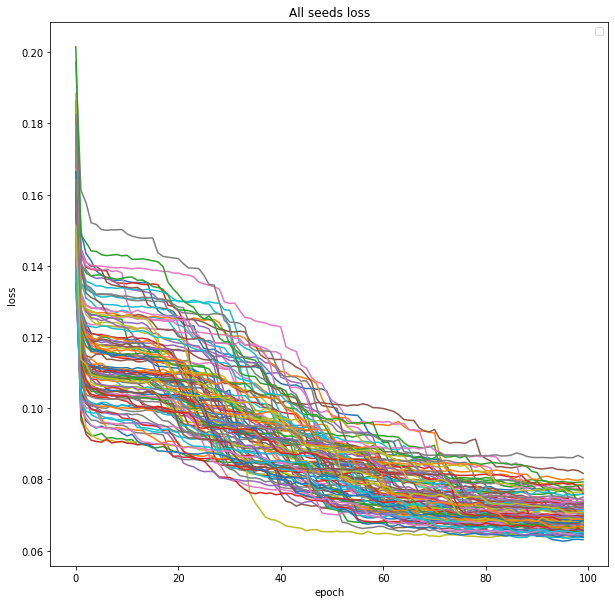

In [ ]:
print("training loss")
plot_seeds(train_loss_1)

Mean Training Loss


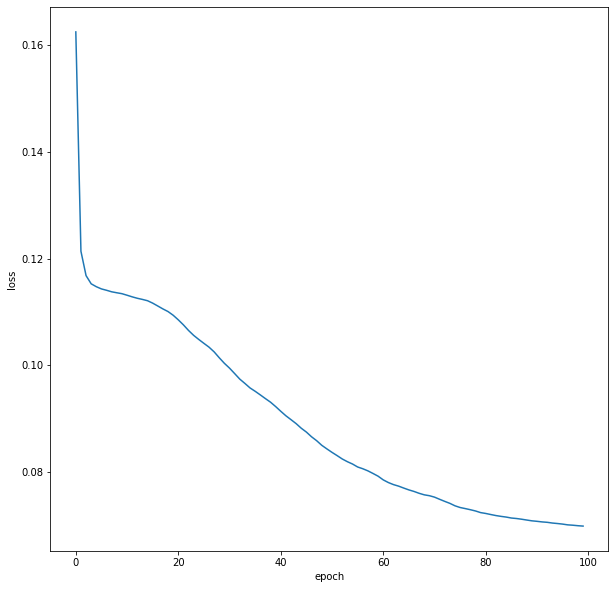

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_1_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


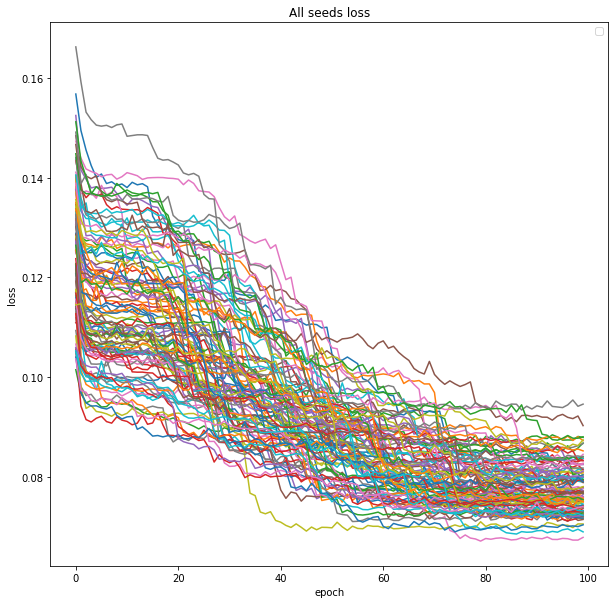

In [ ]:
print("testing loss")
plot_seeds(test_loss_1)

Mean Test Loss


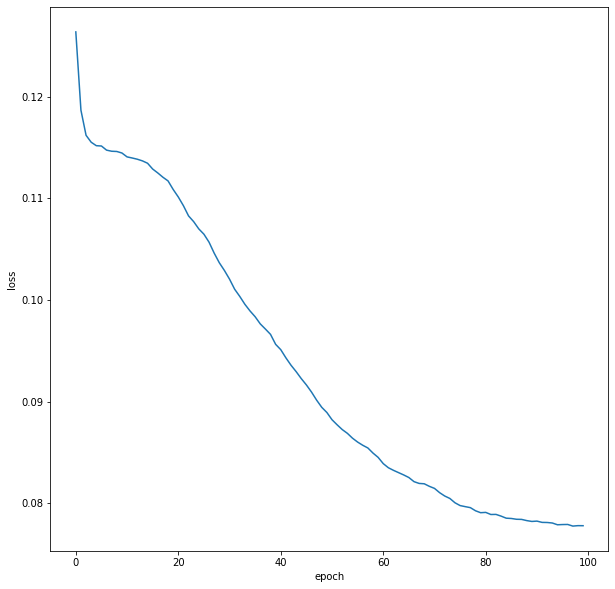

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_1_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 2

It is made of 4 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_2_training = simulation_processing(train_loss_2)
model_2_testing = simulation_processing(test_loss_2)

In [ ]:
model_2_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.161287,0.184864,0.156209,0.174201,0.158969,0.133370,0.159197,0.151937,0.194748,0.195429,...,0.154880,0.179477,0.174729,0.175059,0.163572,0.158295,0.131575,0.230484,0.167255,0.016483
1,0.118700,0.141581,0.115546,0.126768,0.108853,0.097532,0.119865,0.116245,0.147356,0.148953,...,0.113374,0.140605,0.134563,0.134746,0.121496,0.116175,0.090257,0.165716,0.124594,0.015322
2,0.114524,0.138899,0.113162,0.124143,0.104451,0.095787,0.114260,0.113444,0.143650,0.146005,...,0.111285,0.137099,0.129322,0.132257,0.119037,0.113742,0.087540,0.163500,0.120966,0.015493
3,0.113765,0.138260,0.112386,0.123797,0.103260,0.095222,0.113347,0.113124,0.142922,0.145107,...,0.110905,0.136449,0.128171,0.131620,0.117815,0.110497,0.086025,0.162007,0.119913,0.015519
4,0.113888,0.139697,0.113144,0.123448,0.103063,0.095149,0.113422,0.112980,0.142115,0.145403,...,0.110720,0.136155,0.127953,0.131469,0.118045,0.109769,0.086008,0.162329,0.119613,0.015600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.069524,0.069519,0.067424,0.069510,0.074370,0.064844,0.068350,0.070557,0.077010,0.075336,...,0.063471,0.062954,0.065315,0.075800,0.067118,0.064795,0.062012,0.089006,0.069876,0.005177
96,0.070084,0.068267,0.067140,0.069645,0.074053,0.064608,0.068011,0.070621,0.077090,0.074975,...,0.063505,0.062967,0.065025,0.076126,0.066671,0.064905,0.062207,0.089085,0.069773,0.005101
97,0.068355,0.066377,0.066875,0.069599,0.074107,0.064373,0.067196,0.070221,0.077896,0.074666,...,0.063304,0.062628,0.065188,0.075800,0.066097,0.064653,0.062443,0.088829,0.069494,0.005004
98,0.067618,0.066367,0.066815,0.069845,0.073758,0.064857,0.067164,0.070120,0.077239,0.074572,...,0.063239,0.062806,0.065562,0.075465,0.065547,0.064615,0.062202,0.088936,0.069271,0.004918


In [ ]:
model_2_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.125523,0.149416,0.123727,0.131086,0.112775,0.101224,0.126345,0.117511,0.155749,0.156243,...,0.115468,0.145094,0.139609,0.137765,0.127684,0.119792,0.095655,0.170688,0.129254,0.015669
1,0.117477,0.140958,0.117688,0.125095,0.107249,0.097037,0.112477,0.111858,0.147549,0.150129,...,0.113321,0.139655,0.132539,0.133600,0.119351,0.115208,0.090481,0.164517,0.122248,0.015500
2,0.116867,0.139381,0.116693,0.124859,0.104981,0.095613,0.112572,0.112393,0.146994,0.148584,...,0.112704,0.137140,0.130531,0.132043,0.117466,0.112028,0.087961,0.162791,0.120719,0.015673
3,0.116189,0.138695,0.116982,0.124226,0.104702,0.095766,0.111718,0.112245,0.145352,0.147820,...,0.112359,0.137557,0.130447,0.132478,0.117349,0.110469,0.087758,0.161710,0.120144,0.015497
4,0.117118,0.139657,0.117220,0.124548,0.104890,0.095711,0.112577,0.111637,0.143098,0.148484,...,0.112080,0.138163,0.130116,0.131837,0.117908,0.110492,0.087473,0.162022,0.120054,0.015669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.076593,0.076923,0.075014,0.077113,0.081292,0.073539,0.074273,0.077342,0.086089,0.085407,...,0.070554,0.071123,0.072519,0.084819,0.073711,0.071326,0.069628,0.096483,0.077225,0.005249
96,0.076838,0.075431,0.074350,0.076974,0.081823,0.074172,0.073575,0.077297,0.087577,0.085006,...,0.070176,0.070718,0.071783,0.083910,0.074378,0.070355,0.069752,0.096424,0.077025,0.005093
97,0.074361,0.073749,0.074360,0.076549,0.080978,0.073742,0.073002,0.077950,0.086346,0.085566,...,0.070867,0.070924,0.072215,0.083543,0.072845,0.070196,0.070069,0.096515,0.076860,0.005068
98,0.074769,0.073696,0.075078,0.077088,0.081826,0.072501,0.073879,0.077798,0.086662,0.085055,...,0.070759,0.071433,0.072253,0.083956,0.072777,0.071010,0.069352,0.096716,0.076801,0.005041


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_2

[0.008304839815073866,
 0.008106132035526827,
 0.008409042204597046,
 0.008920088829456297,
 0.012047766886087458,
 0.008181340762803808,
 0.008099592455623304,
 0.01018828320080884,
 0.011889390434928695,
 0.011315054999540972,
 0.00935654297779997,
 0.012441735769733757,
 0.007582789336202197,
 0.009481458290774734,
 0.008971426871818799,
 0.009755910153331458,
 0.009077998033195827,
 0.007311416919712501,
 0.008829042788425903,
 0.008140360979304088,
 0.008185577745034152,
 0.008418394715140401,
 0.010571440997326877,
 0.008290871645724982,
 0.009855640131363896,
 0.008015174779721601,
 0.007585541262159019,
 0.007480199893548648,
 0.009621258622917205,
 0.010042378804518595,
 0.008237487671776077,
 0.008086415195408597,
 0.009853571883548733,
 0.008792903826305525,
 0.011588162387091667,
 0.008614487134509364,
 0.008345299757622925,
 0.00895657573977155,
 0.010937454357042202,
 0.008718936443246252,
 0.010708565928342358,
 0.010110029824365912,
 0.008248776439386157,
 0.00910382537

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


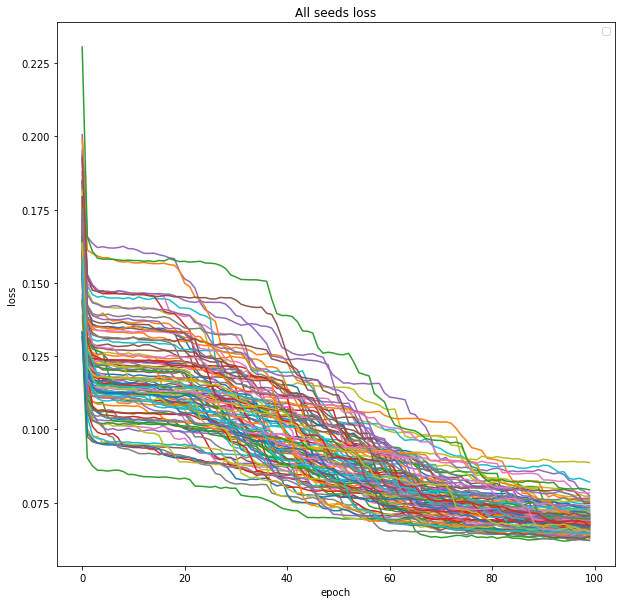

In [ ]:
print("training loss")
plot_seeds(train_loss_2)

Mean Training Loss


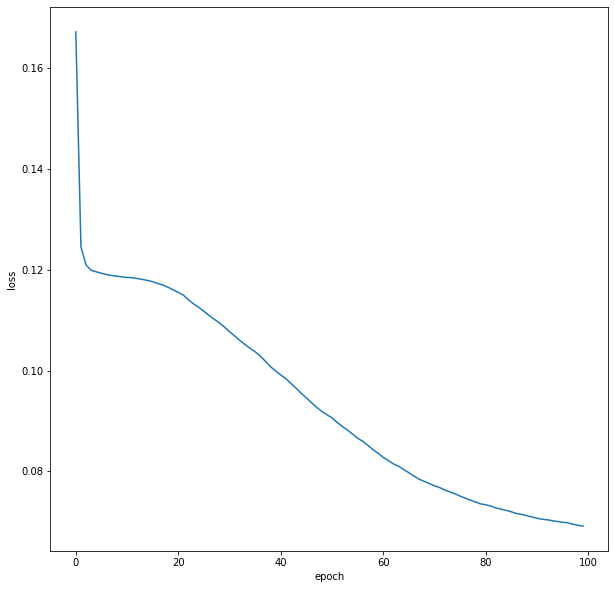

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_2_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


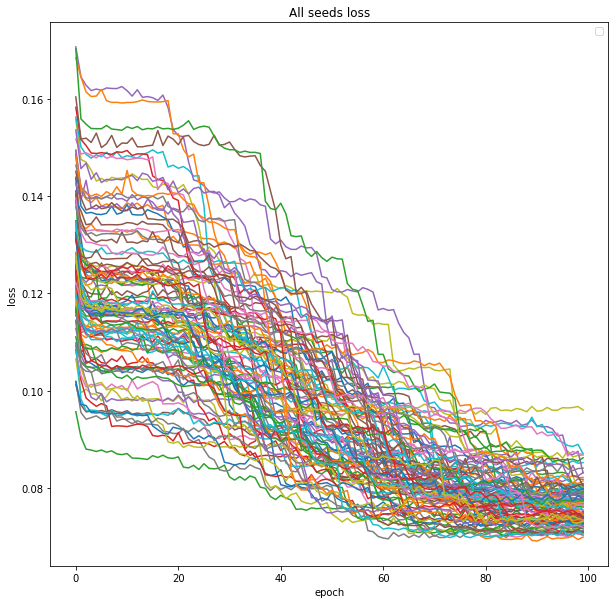

In [ ]:
print("testing loss")
plot_seeds(test_loss_2)

Mean Test Loss


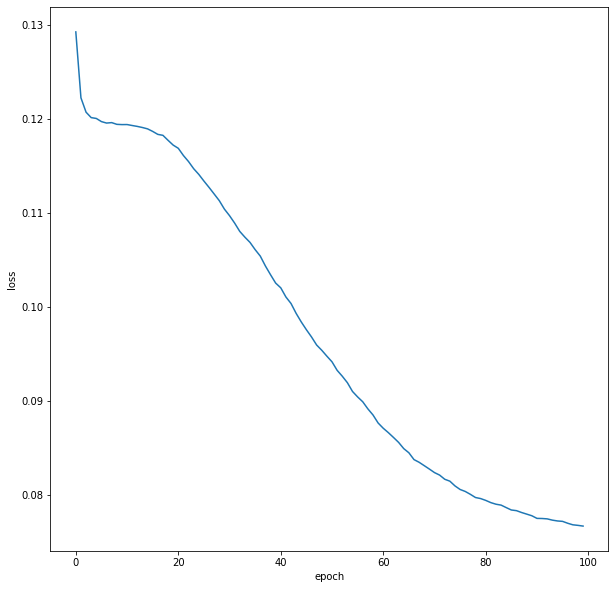

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_2_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 3

It is made of 5 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 25 neural with ReLU Activation
* Layer4 : 50 neural with ReLU Activation
* Layer5 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_3_training = simulation_processing(train_loss_3)
model_3_testing = simulation_processing(test_loss_3)

In [ ]:
model_3_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.156939,0.172184,0.184695,0.168792,0.157264,0.155218,0.166490,0.181482,0.177881,0.193430,...,0.152054,0.161782,0.188916,0.174670,0.169313,0.149495,0.130921,0.208542,0.170005,0.016397
1,0.120764,0.146341,0.144098,0.129680,0.107938,0.118296,0.113843,0.137129,0.121753,0.157974,...,0.117214,0.134851,0.151074,0.134309,0.127059,0.120809,0.100264,0.162322,0.130356,0.014523
2,0.118916,0.143951,0.140669,0.125354,0.106009,0.116008,0.111294,0.135118,0.118304,0.155446,...,0.114839,0.132925,0.147211,0.131068,0.124958,0.117314,0.098145,0.158914,0.126945,0.014589
3,0.118545,0.143824,0.140897,0.123810,0.104856,0.115752,0.110882,0.134771,0.117612,0.154722,...,0.115068,0.132170,0.145256,0.130942,0.124329,0.116638,0.096860,0.158747,0.126095,0.014656
4,0.118614,0.143417,0.140081,0.123935,0.104688,0.115624,0.110817,0.134634,0.117225,0.154615,...,0.114451,0.132107,0.145125,0.130910,0.124339,0.117325,0.096502,0.157946,0.125800,0.014660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.071121,0.070979,0.069854,0.075291,0.069360,0.068072,0.067788,0.069920,0.076002,0.073904,...,0.063826,0.067204,0.066379,0.068751,0.077718,0.065529,0.063826,0.098983,0.072350,0.006618
96,0.071232,0.070923,0.069600,0.075040,0.069011,0.068075,0.068223,0.069303,0.076075,0.074146,...,0.063895,0.067121,0.065946,0.069166,0.077558,0.065646,0.063895,0.098810,0.072093,0.006556
97,0.070994,0.070670,0.069596,0.075092,0.068200,0.068800,0.068051,0.069235,0.077006,0.073727,...,0.064186,0.066966,0.065943,0.068660,0.076682,0.065741,0.064008,0.097966,0.071857,0.006487
98,0.070708,0.070733,0.070039,0.075305,0.067905,0.068352,0.067833,0.069229,0.076936,0.073763,...,0.063867,0.067024,0.065775,0.068456,0.076242,0.065296,0.063867,0.097757,0.071746,0.006471


In [ ]:
model_3_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.125185,0.149159,0.152940,0.134378,0.114421,0.121840,0.117344,0.141587,0.128032,0.165037,...,0.122372,0.138840,0.157711,0.139788,0.128794,0.122044,0.102280,0.170665,0.134679,0.015275
1,0.121139,0.145637,0.146258,0.126317,0.106831,0.117694,0.112166,0.134200,0.120891,0.159964,...,0.116725,0.135150,0.148199,0.132145,0.124040,0.117296,0.098222,0.161151,0.128042,0.014735
2,0.120380,0.144320,0.146209,0.124293,0.106361,0.116560,0.111166,0.134162,0.119114,0.160308,...,0.116114,0.132516,0.147150,0.130893,0.123743,0.115612,0.096875,0.160308,0.126600,0.015029
3,0.121008,0.143813,0.144198,0.124395,0.106679,0.116336,0.111121,0.134554,0.118764,0.159207,...,0.116253,0.133049,0.145398,0.130647,0.123141,0.116426,0.097185,0.159207,0.126320,0.014939
4,0.120329,0.143358,0.147046,0.124147,0.106632,0.117670,0.110907,0.133825,0.120938,0.159896,...,0.115683,0.133446,0.144925,0.130790,0.123114,0.116997,0.096562,0.159896,0.126201,0.015141
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.076965,0.077074,0.077947,0.079867,0.076079,0.074382,0.073189,0.073758,0.082985,0.082768,...,0.070397,0.072987,0.070267,0.074400,0.081300,0.070273,0.069570,0.104326,0.077847,0.006570
96,0.076645,0.077084,0.076876,0.079548,0.075680,0.073861,0.073072,0.074016,0.083398,0.082450,...,0.071294,0.073063,0.070959,0.073911,0.081164,0.070740,0.069593,0.103498,0.077815,0.006501
97,0.077352,0.077621,0.078208,0.080003,0.075529,0.073893,0.073237,0.073794,0.083291,0.082188,...,0.070717,0.073028,0.070783,0.074505,0.080572,0.070293,0.069485,0.103638,0.077591,0.006512
98,0.076858,0.077676,0.077564,0.079567,0.075868,0.073961,0.073027,0.074053,0.084875,0.083253,...,0.070419,0.073182,0.071127,0.074329,0.080883,0.070885,0.069521,0.105062,0.077638,0.006618


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_3

[0.0091980862787826,
 0.009457777081312277,
 0.00955444880113476,
 0.009951529235997904,
 0.008625985998279186,
 0.00862465268745974,
 0.008573950840479842,
 0.007957736728043029,
 0.01095799703674168,
 0.010135102833786333,
 0.009170617017251128,
 0.016862014579925998,
 0.007359370279751517,
 0.010712666863393408,
 0.009815867492561157,
 0.013291966858850337,
 0.008155972416901507,
 0.007820936621961466,
 0.009481284298740485,
 0.007157198979369835,
 0.014010840909882284,
 0.009577619331062907,
 0.008582121763230472,
 0.007860311601742942,
 0.009253335054428397,
 0.009925064161547544,
 0.00969387413113678,
 0.007215919348682167,
 0.010643042765804009,
 0.011796582203410042,
 0.009320646810121132,
 0.008904595624473119,
 0.012548673538429242,
 0.009151425728316155,
 0.010899000674666983,
 0.009260201834474341,
 0.007723255989342505,
 0.00895868716898821,
 0.007933634189350247,
 0.010467992209357768,
 0.009213095916454484,
 0.011136464869201255,
 0.008707795018184776,
 0.008968540608358

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


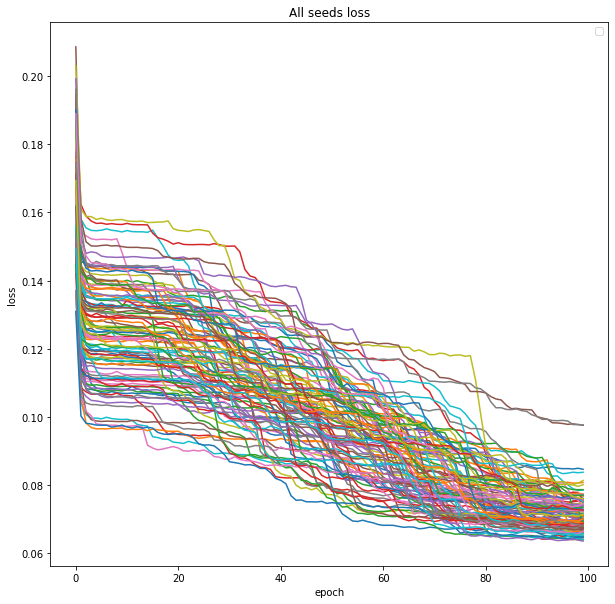

In [ ]:
print("training loss")
plot_seeds(train_loss_3)

Mean Training Loss


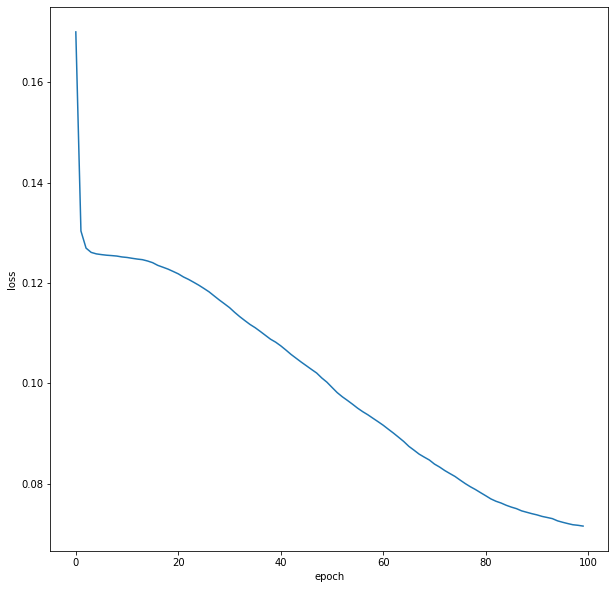

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_3_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


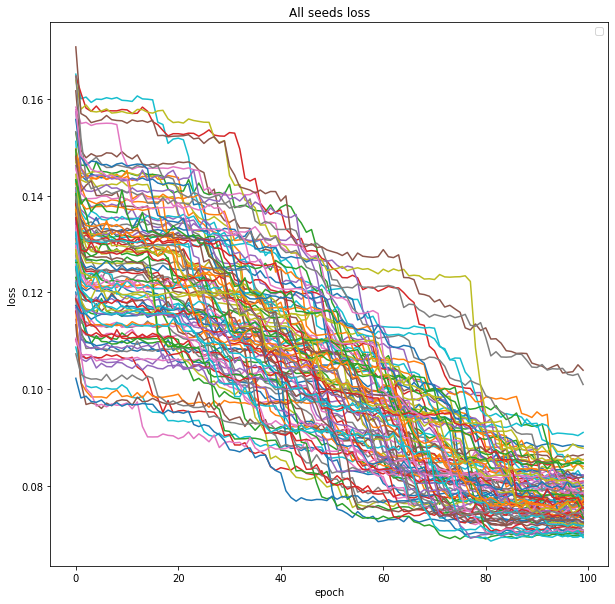

In [ ]:
print("testing loss")
plot_seeds(test_loss_3)

Mean Test Loss


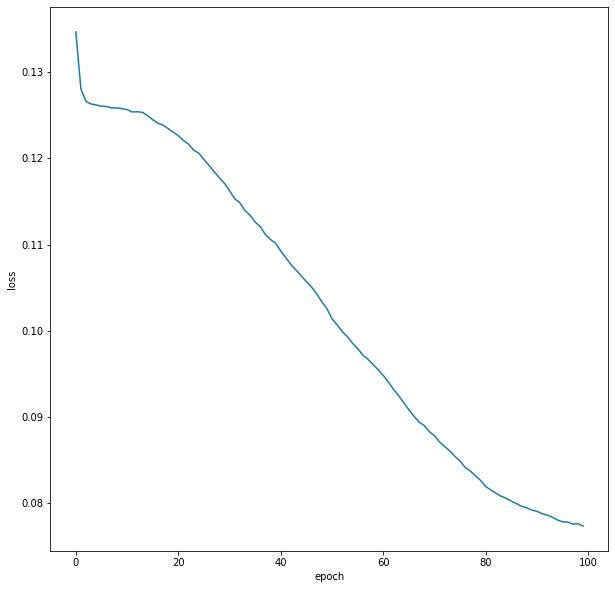

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_3_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 4

It is made of 6 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 50 neural with ReLU Activation
* Layer3 : 25 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 50 neural with ReLU Activation
* Layer6 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_4_training = simulation_processing(train_loss_4)
model_4_testing = simulation_processing(test_loss_4)

In [ ]:
model_4_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.158563,0.167653,0.189812,0.176530,0.152597,0.174712,0.164450,0.194327,0.200010,0.176377,...,0.151192,0.160536,0.152734,0.168912,0.148495,0.179334,0.136867,0.238797,0.171774,0.019299
1,0.124321,0.136477,0.140870,0.148344,0.126537,0.146196,0.135641,0.149729,0.155412,0.138334,...,0.112333,0.130537,0.121473,0.125322,0.109910,0.149939,0.100069,0.187047,0.134371,0.016854
2,0.122971,0.133821,0.136547,0.145675,0.124062,0.144991,0.133784,0.145552,0.153866,0.136410,...,0.110917,0.126668,0.120129,0.120958,0.107971,0.135094,0.098059,0.178815,0.130626,0.016269
3,0.122523,0.133342,0.136131,0.145483,0.123139,0.144494,0.132576,0.145056,0.153146,0.134700,...,0.110418,0.123141,0.119320,0.120056,0.108143,0.128922,0.097524,0.176174,0.129676,0.016148
4,0.123407,0.133164,0.136151,0.145782,0.123191,0.144439,0.132108,0.144807,0.152443,0.134403,...,0.110213,0.122079,0.119536,0.120065,0.107398,0.125163,0.098181,0.175930,0.129384,0.016147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.067417,0.073941,0.081665,0.070697,0.072103,0.071840,0.066533,0.069817,0.074365,0.076869,...,0.066945,0.065693,0.068492,0.076354,0.080251,0.065107,0.064604,0.094796,0.074085,0.007116
96,0.066907,0.072723,0.078723,0.070519,0.071955,0.071886,0.066290,0.069411,0.074416,0.076695,...,0.066773,0.065587,0.067286,0.076342,0.079768,0.064990,0.064336,0.093549,0.073783,0.007049
97,0.067067,0.072589,0.079026,0.071332,0.070496,0.071372,0.066079,0.069363,0.075236,0.076368,...,0.066615,0.064986,0.067135,0.075345,0.079892,0.065000,0.064149,0.093513,0.073611,0.007034
98,0.067440,0.072189,0.078580,0.071362,0.070451,0.071468,0.066319,0.069410,0.074726,0.075629,...,0.066729,0.064448,0.067405,0.074306,0.079833,0.064755,0.064227,0.092943,0.073304,0.006881


In [ ]:
model_4_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.127778,0.142317,0.149788,0.151871,0.128781,0.149442,0.138311,0.154116,0.158540,0.144032,...,0.115626,0.135984,0.122390,0.129713,0.112436,0.154738,0.100922,0.189172,0.138412,0.017363
1,0.123018,0.135750,0.142771,0.146715,0.126346,0.146453,0.133129,0.144603,0.154848,0.139496,...,0.112065,0.131109,0.121848,0.122344,0.107595,0.142015,0.098858,0.181158,0.131819,0.016694
2,0.123437,0.135475,0.140597,0.146147,0.124627,0.146065,0.131388,0.143510,0.155294,0.139278,...,0.112136,0.129152,0.118972,0.120584,0.108010,0.131681,0.097700,0.175083,0.130393,0.016259
3,0.125814,0.135241,0.141212,0.146412,0.124897,0.145411,0.130795,0.143814,0.152952,0.137824,...,0.111088,0.125413,0.118544,0.121135,0.106970,0.125031,0.098074,0.173262,0.129909,0.016151
4,0.122476,0.134858,0.141209,0.147223,0.124024,0.146190,0.130930,0.143849,0.153037,0.137502,...,0.110202,0.125416,0.118270,0.120320,0.107120,0.124248,0.097737,0.174969,0.129596,0.016395
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.073577,0.076955,0.083956,0.076626,0.077937,0.075136,0.070505,0.074254,0.081503,0.082724,...,0.070736,0.070950,0.072270,0.078660,0.083919,0.069713,0.067721,0.099124,0.078368,0.007141
96,0.073633,0.077879,0.085419,0.077041,0.076001,0.075539,0.070215,0.073864,0.082936,0.082632,...,0.071129,0.070713,0.072156,0.078126,0.084640,0.069152,0.067886,0.097487,0.078299,0.007079
97,0.073802,0.077308,0.084302,0.076277,0.077039,0.076204,0.070413,0.074608,0.082070,0.082307,...,0.070870,0.070132,0.072212,0.078610,0.083865,0.069422,0.067133,0.097265,0.078163,0.006967
98,0.073281,0.076980,0.084633,0.077110,0.076252,0.075489,0.070168,0.074432,0.081712,0.082554,...,0.070362,0.069495,0.071825,0.077034,0.084527,0.069325,0.067535,0.097754,0.077930,0.006971


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_4

[0.008139275943886113,
 0.009178441647151352,
 0.011651199519212587,
 0.008823758398891456,
 0.009019975597091532,
 0.009284489836292565,
 0.007260278370005421,
 0.008248708010136772,
 0.009680937829712868,
 0.010244630491975716,
 0.010521795011990418,
 0.007815382838599306,
 0.007367455074801883,
 0.011349570564851539,
 0.012544272949186096,
 0.010496933599539982,
 0.009150056028234179,
 0.0071476466180140155,
 0.009838125342709222,
 0.0070964972508227794,
 0.008658478919146461,
 0.008144232697339101,
 0.016393535058016273,
 0.007430091644340858,
 0.009710745546108174,
 0.007830157853733578,
 0.006669932863411423,
 0.007591225218992006,
 0.00817419372440218,
 0.009696758710702497,
 0.007572800195671811,
 0.008308037779781813,
 0.009213546167860132,
 0.00884937905400335,
 0.011600959404571329,
 0.007644082383655427,
 0.008278239714227836,
 0.018363662373796278,
 0.014854085066514911,
 0.009654228392476467,
 0.009965574875327192,
 0.01061173448771012,
 0.016249291437193596,
 0.008717054

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


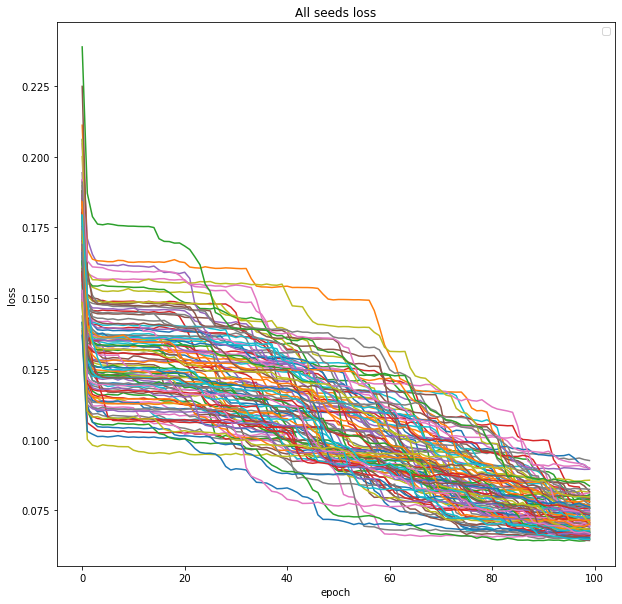

In [ ]:
print("training loss")
plot_seeds(train_loss_4)

Mean Training Loss


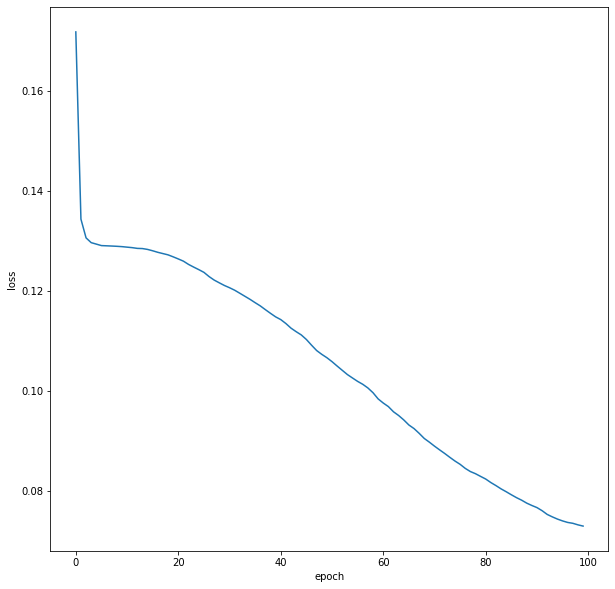

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_4_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


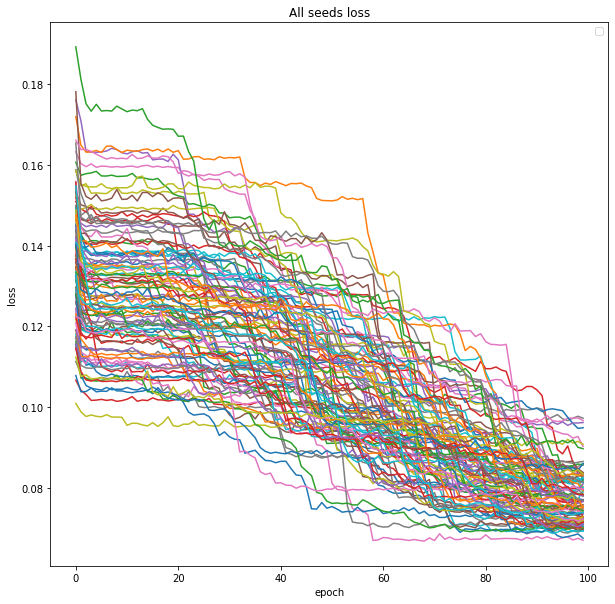

In [ ]:
print("testing loss")
plot_seeds(test_loss_4)

Mean Test Loss


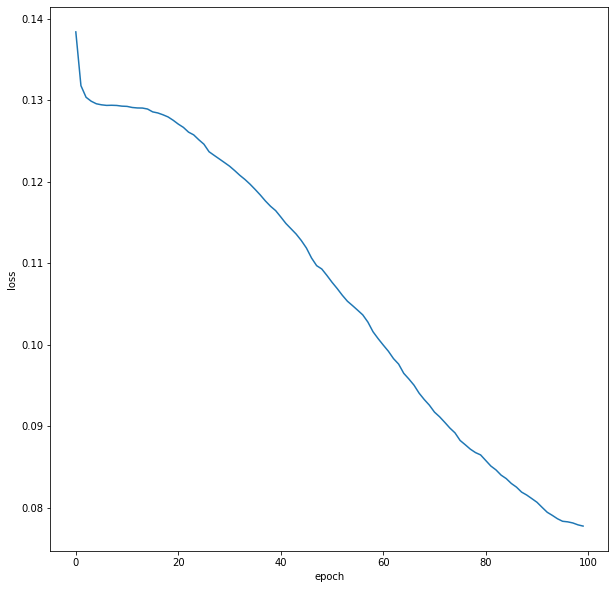

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_4_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 5

It is made of 7 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 75 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 50 neural with ReLU Activation
* Layer6 : 75 neural with ReLU Activation
* Layer7 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_5_training = simulation_processing(train_loss_5)
model_5_testing = simulation_processing(test_loss_5)

In [ ]:
model_5_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.163278,0.185234,0.194154,0.155297,0.172875,0.159347,0.162117,0.164531,0.189102,0.182895,...,0.171872,0.173121,0.142808,0.203693,0.189889,0.144168,0.136186,0.215554,0.173840,0.018292
1,0.123691,0.139428,0.149363,0.114604,0.143508,0.123945,0.130260,0.122332,0.148538,0.128782,...,0.133433,0.129722,0.105683,0.146880,0.151683,0.107156,0.099119,0.164953,0.130891,0.016361
2,0.121624,0.135230,0.142490,0.112391,0.133026,0.119342,0.129021,0.117942,0.146746,0.126376,...,0.129572,0.123671,0.104629,0.143260,0.147341,0.105031,0.095341,0.160611,0.127254,0.016151
3,0.120903,0.134947,0.141824,0.112042,0.127482,0.118619,0.128914,0.117301,0.146059,0.126236,...,0.128880,0.123138,0.103726,0.142615,0.145239,0.103674,0.094693,0.160135,0.126407,0.016124
4,0.119702,0.134442,0.141924,0.111902,0.126402,0.118653,0.128788,0.117014,0.146185,0.126295,...,0.128758,0.123008,0.103449,0.142140,0.144772,0.103689,0.094441,0.160027,0.126153,0.016111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.069520,0.075016,0.081294,0.071507,0.073418,0.068920,0.074726,0.075589,0.081217,0.072912,...,0.070445,0.065516,0.071709,0.090282,0.102386,0.070047,0.065425,0.109305,0.077119,0.009753
96,0.069426,0.075253,0.080694,0.070926,0.073157,0.068966,0.073027,0.075297,0.081224,0.073044,...,0.070500,0.065071,0.071149,0.089199,0.102388,0.069727,0.065071,0.108921,0.076654,0.009604
97,0.069169,0.074873,0.079905,0.071057,0.072388,0.068968,0.072960,0.074804,0.080794,0.072686,...,0.070087,0.064978,0.070986,0.082977,0.102474,0.069389,0.064978,0.104743,0.076206,0.009190
98,0.068952,0.070732,0.079758,0.071506,0.071073,0.068832,0.072851,0.072356,0.080415,0.071912,...,0.067383,0.065045,0.070466,0.079830,0.102364,0.069572,0.065045,0.104224,0.075729,0.008957


In [ ]:
model_5_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.124939,0.147727,0.162505,0.114504,0.150685,0.131859,0.130376,0.125477,0.149501,0.135865,...,0.139442,0.139649,0.108428,0.157372,0.156398,0.109880,0.103323,0.169280,0.135440,0.016803
1,0.123356,0.137124,0.148272,0.112109,0.140644,0.120206,0.127686,0.121398,0.145789,0.129634,...,0.130960,0.126204,0.108022,0.144613,0.147850,0.105442,0.094603,0.164148,0.128456,0.016327
2,0.123235,0.137417,0.146800,0.111483,0.130544,0.119220,0.127448,0.117118,0.144799,0.128558,...,0.129885,0.125137,0.106246,0.144012,0.144257,0.103746,0.093426,0.161790,0.127032,0.016263
3,0.120237,0.136042,0.145962,0.111144,0.128371,0.118319,0.127021,0.118826,0.144421,0.129002,...,0.129726,0.125616,0.105142,0.143614,0.143724,0.103726,0.093338,0.161319,0.126577,0.016232
4,0.120736,0.135692,0.146445,0.111588,0.127869,0.118620,0.126876,0.117615,0.145738,0.129517,...,0.129447,0.124668,0.105556,0.143612,0.142262,0.104007,0.093324,0.161629,0.126639,0.016359
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.073648,0.077898,0.085339,0.075834,0.077574,0.071263,0.076712,0.078818,0.087009,0.079051,...,0.073930,0.070057,0.074639,0.093205,0.102807,0.073370,0.067822,0.109627,0.080125,0.009296
96,0.073138,0.078284,0.084661,0.075358,0.075845,0.071140,0.075997,0.078708,0.087655,0.080549,...,0.073416,0.069777,0.074990,0.090338,0.103015,0.073454,0.067609,0.107825,0.079750,0.009108
97,0.073069,0.077234,0.084743,0.075502,0.076103,0.070790,0.075507,0.076343,0.086894,0.080170,...,0.073370,0.069729,0.076111,0.084128,0.102345,0.073892,0.067822,0.105561,0.079400,0.008666
98,0.072967,0.073700,0.084221,0.075272,0.075698,0.070986,0.075936,0.075966,0.087784,0.079424,...,0.069784,0.069417,0.072970,0.082287,0.102442,0.073818,0.067789,0.105873,0.078943,0.008597


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_5

[0.007830402087283165,
 0.0077952153534503865,
 0.012507103984602495,
 0.008373800817454145,
 0.008588098266015134,
 0.007754970477600093,
 0.009159700382761145,
 0.008377303976167517,
 0.01338218957123948,
 0.009827627597899277,
 0.011295928754855983,
 0.008237334697716377,
 0.007366103968655371,
 0.011075543239287652,
 0.010228209012687806,
 0.009594279867200142,
 0.009258400254731963,
 0.007184030955587572,
 0.008450050607362558,
 0.007015747882259216,
 0.011006378105946154,
 0.007867399635416243,
 0.01052887403563536,
 0.00774024905248087,
 0.013311084382999877,
 0.010174329015172647,
 0.00717203866778653,
 0.007620812972616275,
 0.007981803211186345,
 0.008883028743832207,
 0.007397985651255492,
 0.010587700961871229,
 0.029904462585779633,
 0.011202913616235322,
 0.012210676920662664,
 0.010377176853410325,
 0.012313117599773448,
 0.00905023779830515,
 0.007924930374910726,
 0.013145369853901275,
 0.018762692389268417,
 0.010276823798592153,
 0.008273747867575568,
 0.008580265973

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


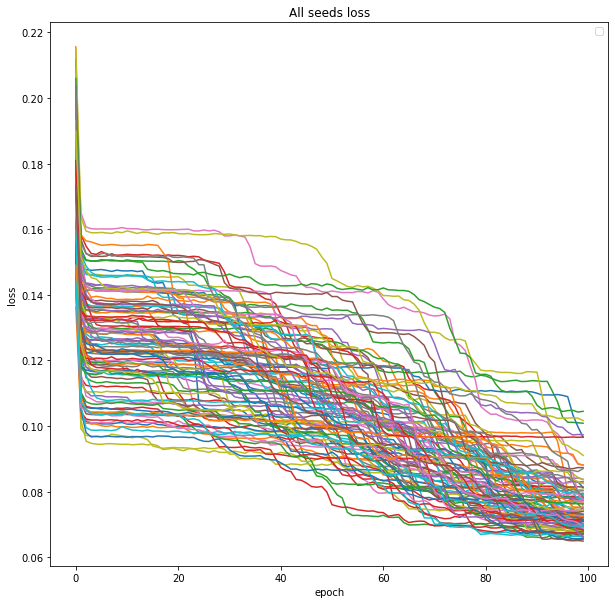

In [ ]:
print("training loss")
plot_seeds(train_loss_5)

Mean Training Loss


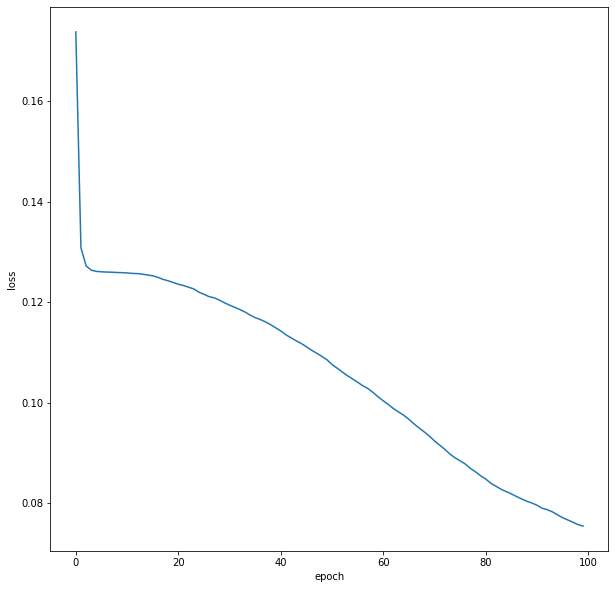

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_5_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


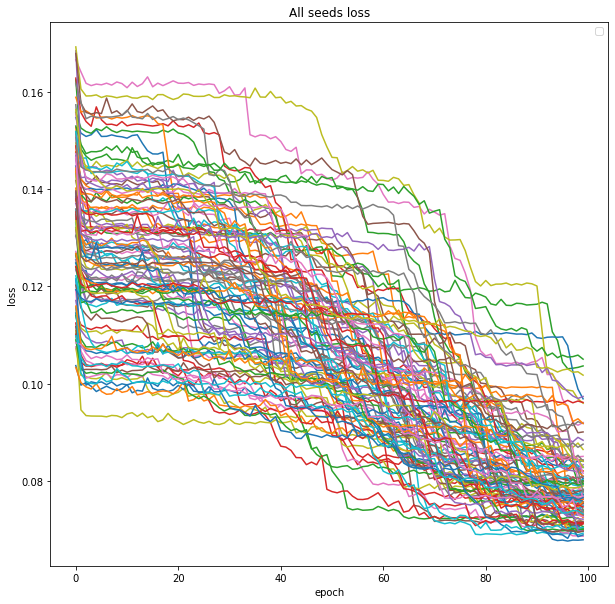

In [ ]:
print("testing loss")
plot_seeds(test_loss_5)

Mean Test Loss


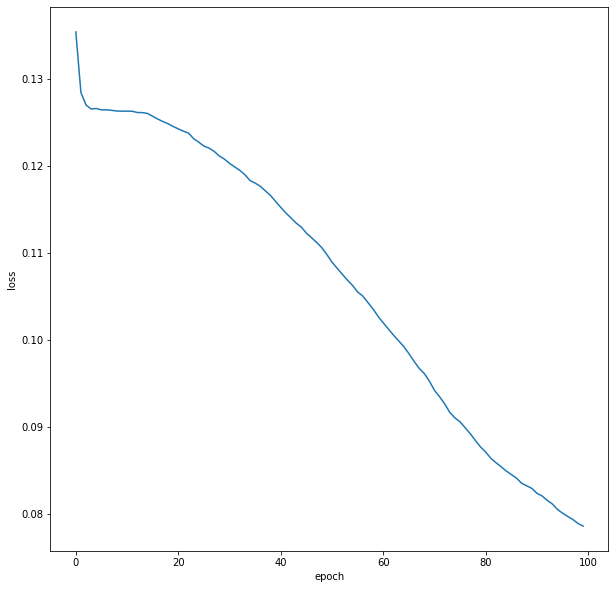

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_5_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Model 6

It is made of 8 layers:


* Layer1 : 100 neural with ReLU Activation
* Layer2 : 75 neural with ReLU Activation
* Layer3 : 50 neural with ReLU Activation
* Layer4 : 25 neural with ReLU Activation
* Layer5 : 25 neural with ReLU Activation
* Layer6 : 50 neural with ReLU Activation
* Layer7 : 75 neural with ReLU Activation
* Layer8 : 100 neural with ReLU Activation







## DataFrame



1.   Training Loss:
2.   Testing Loss

Both DataFrame coantains the Loss values for each seed at every epoch. It also contains the mean, max and min also Standard deviation across all Seed at each epoch.

In [ ]:
model_6_training = simulation_processing(train_loss_6)
model_6_testing = simulation_processing(test_loss_6)

In [ ]:
model_6_training

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.159648,0.191895,0.182517,0.176350,0.169815,0.163163,0.149255,0.177609,0.179588,0.217933,...,0.157180,0.165989,0.157706,0.195559,0.179601,0.154593,0.140529,0.223097,0.176225,0.018521
1,0.121109,0.135349,0.151406,0.135828,0.119957,0.117843,0.111707,0.127011,0.129044,0.182960,...,0.122625,0.115839,0.118983,0.156712,0.134013,0.119411,0.105592,0.182960,0.132216,0.014840
2,0.118704,0.129142,0.146130,0.131874,0.118014,0.111268,0.109586,0.118983,0.126604,0.175115,...,0.121398,0.109509,0.117478,0.154780,0.131077,0.114144,0.104335,0.175115,0.128276,0.014090
3,0.118459,0.127606,0.145331,0.131615,0.117772,0.110200,0.108995,0.118139,0.125911,0.174184,...,0.120419,0.108501,0.116945,0.154301,0.130251,0.113501,0.104099,0.174184,0.127331,0.013985
4,0.118449,0.127337,0.145390,0.131525,0.117108,0.110242,0.108926,0.117855,0.126030,0.174136,...,0.119631,0.108557,0.116638,0.154472,0.129252,0.112978,0.104046,0.174136,0.127056,0.013997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.073653,0.074495,0.092420,0.072236,0.073235,0.093035,0.069215,0.082069,0.078177,0.076891,...,0.069001,0.065540,0.079653,0.096338,0.078643,0.107724,0.065540,0.115127,0.083897,0.012484
96,0.073382,0.074489,0.091778,0.072188,0.071189,0.092761,0.068007,0.082463,0.077189,0.077237,...,0.069215,0.066231,0.079451,0.092351,0.078950,0.107723,0.065603,0.115126,0.083483,0.012436
97,0.073287,0.074937,0.089359,0.071823,0.071037,0.091571,0.068033,0.082102,0.077007,0.076822,...,0.068721,0.066162,0.079141,0.090367,0.078340,0.107795,0.066104,0.115041,0.082912,0.012376
98,0.071345,0.075175,0.089010,0.071873,0.070341,0.091381,0.067559,0.080778,0.076977,0.076568,...,0.068600,0.065739,0.079416,0.090497,0.077846,0.107811,0.065739,0.115078,0.082389,0.012321


In [ ]:
model_6_testing

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,min,max,mean,std
0,0.128509,0.142815,0.158755,0.140991,0.122867,0.127030,0.111864,0.135133,0.132643,0.193671,...,0.126028,0.124452,0.121356,0.158414,0.139562,0.124077,0.107530,0.193671,0.136979,0.016158
1,0.122008,0.128197,0.152838,0.131677,0.118955,0.113757,0.109420,0.120302,0.129315,0.179727,...,0.123463,0.114822,0.118638,0.155316,0.133052,0.114021,0.105105,0.179727,0.129669,0.014605
2,0.120550,0.127335,0.149574,0.131386,0.118577,0.110922,0.108459,0.117688,0.126741,0.176233,...,0.122785,0.109365,0.117570,0.154545,0.132003,0.113629,0.105406,0.176233,0.127857,0.014316
3,0.120603,0.126899,0.148854,0.130134,0.118865,0.110785,0.108132,0.117443,0.127280,0.176476,...,0.121759,0.109301,0.117819,0.154229,0.130119,0.112867,0.104636,0.176476,0.127524,0.014315
4,0.120784,0.126756,0.149269,0.130550,0.117120,0.110974,0.108230,0.117298,0.126920,0.177848,...,0.121702,0.109001,0.117255,0.153993,0.130091,0.112743,0.104581,0.177848,0.127329,0.014483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.075924,0.078531,0.098233,0.073896,0.075199,0.094592,0.070221,0.083066,0.083718,0.080607,...,0.071484,0.070145,0.081416,0.095909,0.079792,0.107143,0.068612,0.115825,0.085987,0.011880
96,0.076170,0.078135,0.096561,0.073921,0.074626,0.092917,0.069458,0.083071,0.082297,0.080624,...,0.071611,0.069001,0.081471,0.092846,0.079804,0.107189,0.069001,0.115500,0.085562,0.011862
97,0.075679,0.078571,0.095057,0.074292,0.074210,0.093646,0.069515,0.083435,0.082898,0.080369,...,0.071788,0.068714,0.081846,0.091953,0.080479,0.107193,0.068442,0.115644,0.085104,0.011789
98,0.074283,0.078373,0.094552,0.074344,0.074599,0.092722,0.069768,0.080498,0.082354,0.080712,...,0.072153,0.068960,0.080952,0.092164,0.079315,0.107357,0.068960,0.115427,0.084498,0.011687


## MSE

It is calacuted after every seeding.

In [ ]:
mean_square_error_6

[0.008069147551464071,
 0.010293550542104788,
 0.015324086262305232,
 0.007935859957936832,
 0.008224386264233033,
 0.015910607882095126,
 0.007071047505015574,
 0.010840138190966903,
 0.009604299300698716,
 0.0100531020564471,
 0.013209698723281049,
 0.010234516192195127,
 0.021252243172946966,
 0.010383995248305307,
 0.010176660898913448,
 0.015203329666132694,
 0.010755719174508047,
 0.00718310969688199,
 0.010864044269093025,
 0.011131616723522917,
 0.009473995009430067,
 0.010378422446041551,
 0.008240886097065546,
 0.009175420358248167,
 0.01558162611541252,
 0.01055124931382019,
 0.007236798921806975,
 0.011745719801953445,
 0.011432135096709508,
 0.011445489044397269,
 0.008272522095565006,
 0.017938469309145885,
 0.010928243474460381,
 0.02702364470929191,
 0.012973551567287429,
 0.0192332725712783,
 0.012130263916740524,
 0.008140745431117945,
 0.012333024089687141,
 0.013269408294389329,
 0.0102469494029083,
 0.012789336893494653,
 0.007721317832537702,
 0.01482661701535002,

## Plots



1.   Training Loss 
2.   Mean Training Loss
3.   Testing Loss
4.   Mean Testing Loss


training loss


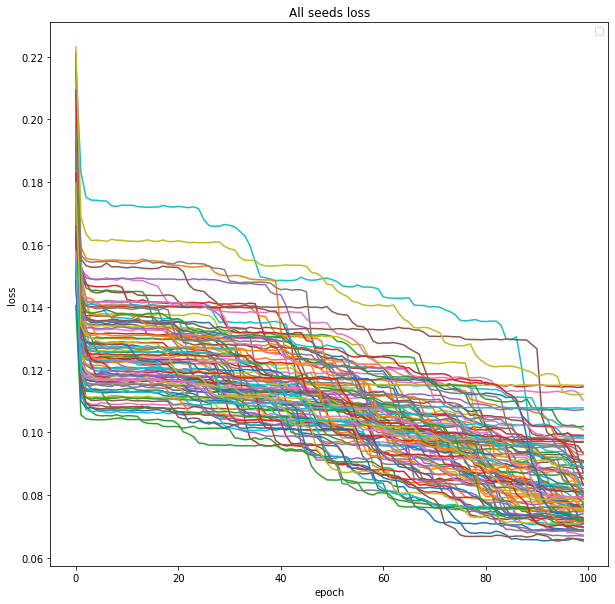

In [ ]:
print("training loss")
plot_seeds(train_loss_6)

Mean Training Loss


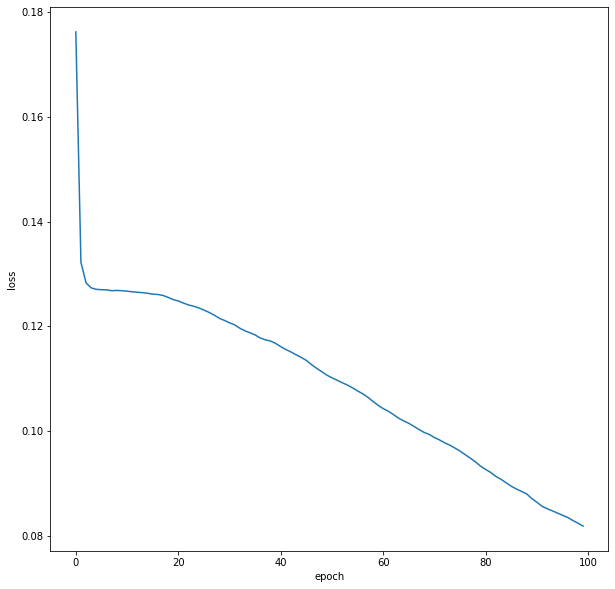

In [ ]:
print("Mean Training Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_6_training.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

testing loss


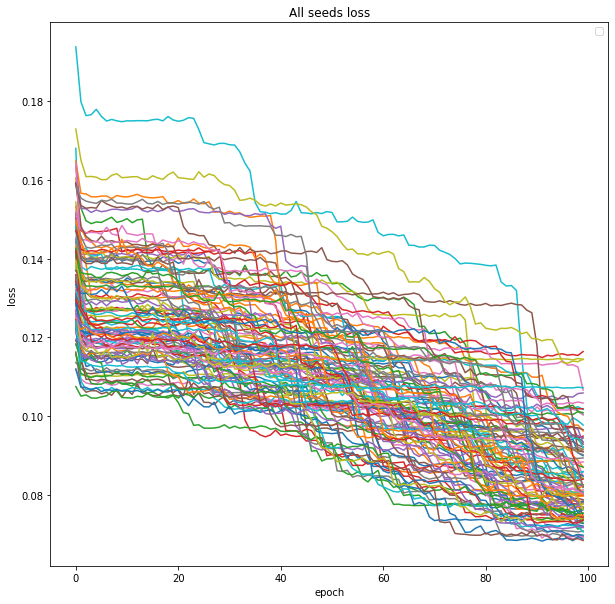

In [ ]:
print("testing loss")
plot_seeds(test_loss_6)

Mean Test Loss


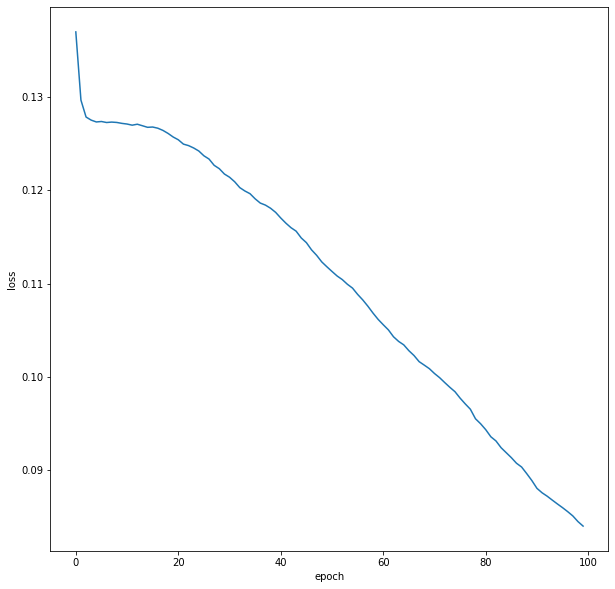

In [ ]:
print("Mean Test Loss")
plt.figure(figsize=(10, 10))
plt.plot(model_6_testing.loc[:,'mean'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# Comparative Graph of all model



*   Training loss
*   Testing loss



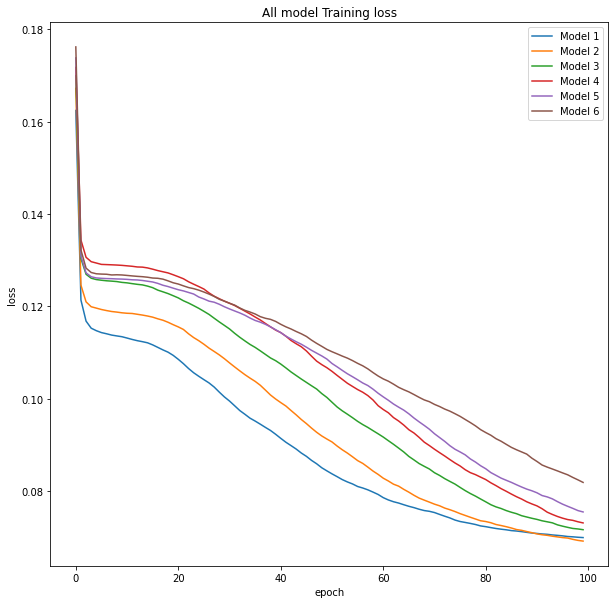

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(model_1_training.loc[:,'mean'], label = "Model 1")
plt.plot(model_2_training.loc[:,'mean'], label = "Model 2")
plt.plot(model_3_training.loc[:,'mean'], label = "Model 3")
plt.plot(model_4_training.loc[:,'mean'], label = "Model 4")
plt.plot(model_5_training.loc[:,'mean'], label = "Model 5")
plt.plot(model_6_training.loc[:,'mean'], label = "Model 6")
plt.title('All model Training loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()

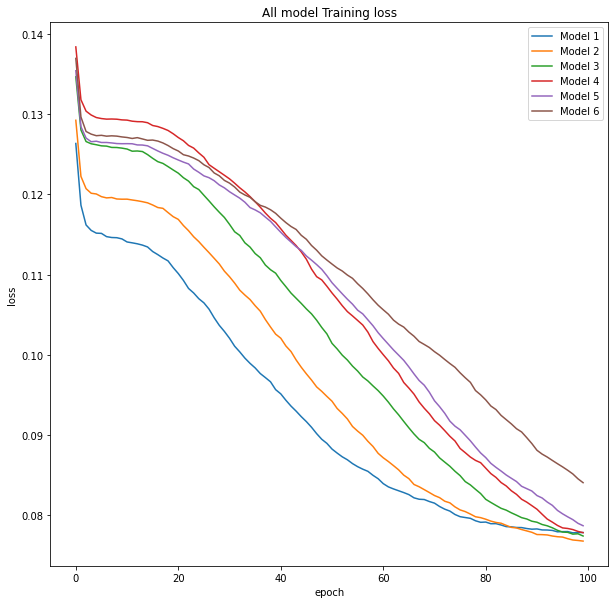

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(model_1_testing.loc[:,'mean'], label = "Model 1")
plt.plot(model_2_testing.loc[:,'mean'], label = "Model 2")
plt.plot(model_3_testing.loc[:,'mean'], label = "Model 3")
plt.plot(model_4_testing.loc[:,'mean'], label = "Model 4")
plt.plot(model_5_testing.loc[:,'mean'], label = "Model 5")
plt.plot(model_6_testing.loc[:,'mean'], label = "Model 6")
plt.title('All model Training loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()